# Multiclass semantic segmentation using DeepLabV3+
- https://keras.io/examples/vision/deeplabv3_plus/
- https://learnopencv.com/deeplabv3-ultimate-guide/

## Dataset
Rellis-3D in **All labels (20 classes)**

https://arxiv.org/abs/1811.12596

## Guardar modelo, pesos y como reentrenar

https://www.tensorflow.org/tutorials/keras/save_and_load?hl=es-419

### Environment tf39

In [1]:
import os
import numpy as np
from glob import glob
import cv2
from scipy.io import loadmat
import matplotlib.pyplot as plt

import keras
from keras import layers
from keras import ops
from keras.applications.resnet import ResNet50
from keras.applications.resnet import preprocess_input

# For data preprocessing
import tensorflow as tf
from tensorflow import image as tf_image
from tensorflow import data as tf_data
from tensorflow import io as tf_io
import warnings
warnings.filterwarnings('ignore')


In [2]:
print(keras.__version__)
print(tf.__version__)

3.0.5
2.16.1


In [3]:
#!pip install tensorflow
!pip check tensorflow

No broken requirements found.


## Loading Rellis-3D Dataset


In [4]:
IMAGE_SIZE = 128
BATCH_SIZE = 4
NUM_CLASSES = 20
TRAIN_DIR = "./rellis20/train"
VALID_DIR = "./rellis20/val"
TEST_DIR = "./rellis20/test"

train_images = sorted(glob(os.path.join(TRAIN_DIR, "images/*")))
train_masks = sorted(glob(os.path.join(TRAIN_DIR, "labels/*")))
val_images = sorted(glob(os.path.join(VALID_DIR, "images/*")))
val_masks = sorted(glob(os.path.join(VALID_DIR, "labels/*")))
test_images = sorted(glob(os.path.join(TEST_DIR, "images/*")))
test_masks = sorted(glob(os.path.join(TEST_DIR, "labels/*")))
test_maskscolors = sorted(glob(os.path.join(TEST_DIR, "masks_colors/*")))

print(len(train_images))
print(len(train_masks))
print(len(val_images))
print(len(val_masks))
print(len(test_images))
print(len(test_masks))
print(len(test_maskscolors))

3302
3302
983
983
1672
1672
1672


In [5]:
print(train_masks[0])

./rellis20/train\labels\frame000000-1581624075_250_20.png


In [6]:
def read_image(image_path, mask=False):
    image = tf_io.read_file(image_path)
    if mask:
        image = tf_image.decode_png(image, channels=1)
        image.set_shape([None, None, 1])
        image = tf_image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
        image = tf.round(image) 
    else:
        image = tf_image.decode_png(image, channels=3)
        image.set_shape([None, None, 3])
        image = tf_image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    return image


def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask


def data_generator(image_list, mask_list, batch_size):
    dataset = tf_data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf_data.AUTOTUNE)
    dataset = dataset.batch(batch_size, drop_remainder=True)
    return dataset

train_dataset = data_generator(train_images, train_masks,BATCH_SIZE)
val_dataset = data_generator(val_images, val_masks,BATCH_SIZE)
#test_dataset = data_generator(test_images, test_masks, 1)     # Batchsize=1

print("Train Dataset:", train_dataset)
print("Val Dataset:", val_dataset)
#print("Test Dataset:", test_dataset)

Train Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(4, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 128, 128, 1), dtype=tf.float32, name=None))>
Val Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(4, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(4, 128, 128, 1), dtype=tf.float32, name=None))>


### Check the shape of GT masks id

In [7]:
# extract Gt mask id
path_gt_mask = test_masks[0]
gtmask0 = read_image(path_gt_mask, mask=True)

print(gtmask0.shape)
#print(gtmask0)

(128, 128, 1)


# Define the U-NET model
Based on: https://github.com/rkshiyaniya/Image-Segmentation-Using-TensorFlow/blob/main/UNet_OxfordPets.ipynb
With the dataset prepared, you can now build the UNet. Here is the overall architecture as shown in class:

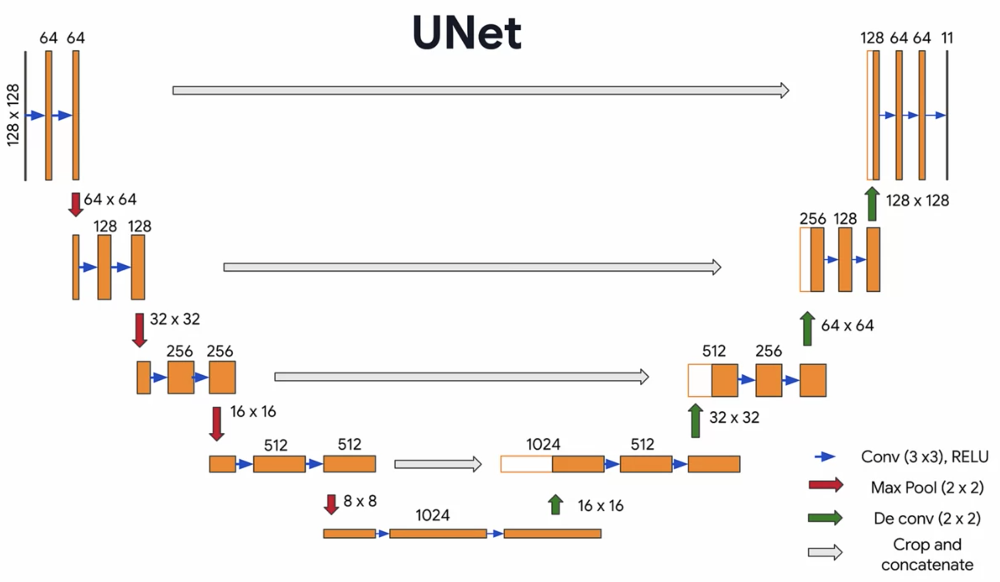!

A UNet consists of an encoder (downsampler) and decoder (upsampler) with a bottleneck in between. The gray arrows correspond to the skip connections that concatenate encoder block outputs to each stage of the decoder. Let's see how to implement these starting with the encoder.

### Encoder
Like the FCN model you built in the previous lesson, the encoder here will have repeating blocks (red boxes in the figure below) so it's best to create functions for it to make the code modular. These encoder blocks will contain two Conv2D layers activated by ReLU, followed by a MaxPooling and Dropout layer. As discussed in class, each stage will have increasing number of filters and the dimensionality of the features will reduce because of the pooling layer.

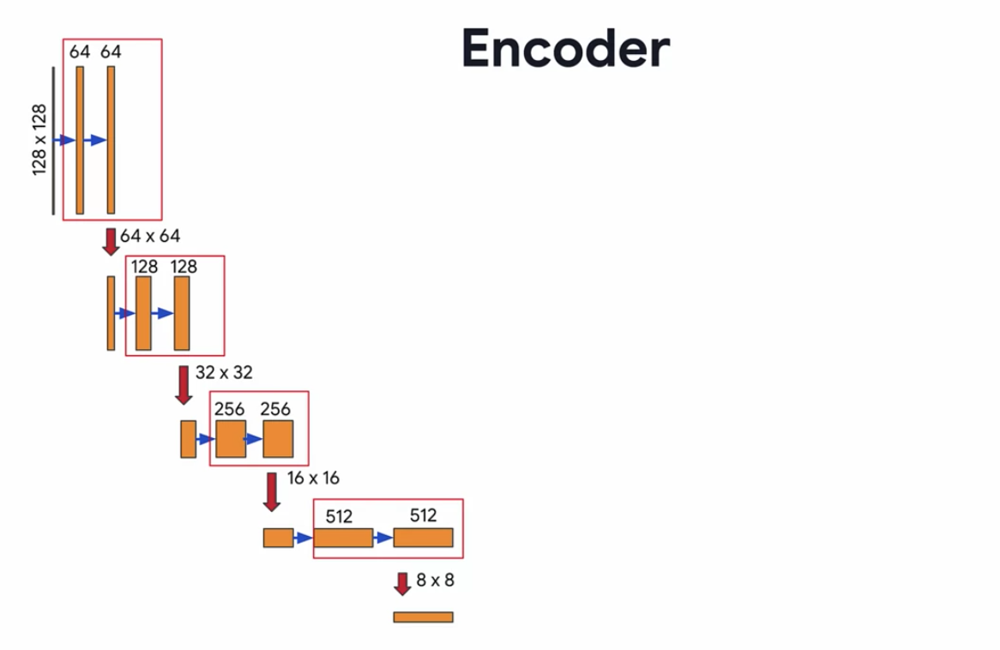!


The encoder utilities will have three functions:

- conv2d_block() - to add two convolution layers and ReLU activations
- encoder_block() - to add pooling and dropout to the conv2d blocks. Recall that in UNet, you need to save the output of the convolution layers at each block so this function will return two values to take that into account (i.e. output of the conv block and the dropout)
- encoder() - to build the entire encoder. This will return the output of the last encoder block as well as the output of the previous conv blocks. These will be concatenated to the decoder blocks as you'll see later.

In [8]:
# Encoder Utilities

def conv2d_block(input_tensor, n_filters, kernel_size = 3):
  '''
  Adds 2 convolutional layers with the parameters passed to it

  Args:
    input_tensor (tensor) -- the input tensor
    n_filters (int) -- number of filters
    kernel_size (int) -- kernel size for the convolution

  Returns:
    tensor of output features
  '''
  # first layer
  x = input_tensor
  for i in range(2):
    x = tf.keras.layers.Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
            kernel_initializer = 'he_normal', padding = 'same')(x)
    x = tf.keras.layers.Activation('relu')(x)
  
  return x


def encoder_block(inputs, n_filters=64, pool_size=(2,2), dropout=0.3):
  '''
  Adds two convolutional blocks and then perform down sampling on output of convolutions.

  Args:
    input_tensor (tensor) -- the input tensor
    n_filters (int) -- number of filters
    kernel_size (int) -- kernel size for the convolution

  Returns:
    f - the output features of the convolution block 
    p - the maxpooled features with dropout
  '''

  f = conv2d_block(inputs, n_filters=n_filters)
  p = tf.keras.layers.MaxPooling2D(pool_size=(2,2))(f)
  p = tf.keras.layers.Dropout(0.3)(p)

  return f, p


def encoder(inputs):
  '''
  This function defines the encoder or downsampling path.

  Args:
    inputs (tensor) -- batch of input images

  Returns:
    p4 - the output maxpooled features of the last encoder block
    (f1, f2, f3, f4) - the output features of all the encoder blocks
  '''
  f1, p1 = encoder_block(inputs, n_filters=64, pool_size=(2,2), dropout=0.3)
  f2, p2 = encoder_block(p1, n_filters=128, pool_size=(2,2), dropout=0.3)
  f3, p3 = encoder_block(p2, n_filters=256, pool_size=(2,2), dropout=0.3)
  f4, p4 = encoder_block(p3, n_filters=512, pool_size=(2,2), dropout=0.3)

  return p4, (f1, f2, f3, f4)


### Bottleneck
A bottleneck follows the encoder block and is used to extract more features. This does not have a pooling layer so the dimensionality remains the same. You can use the conv2d_block() function defined earlier to implement this.

In [9]:
def bottleneck(inputs):
  '''
  This function defines the bottleneck convolutions to extract more features before the upsampling layers.
  '''
  
  bottle_neck = conv2d_block(inputs, n_filters=1024)

  return bottle_neck

### Decoder
Finally, we have the decoder which upsamples the features back to the original image size. At each upsampling level, you will take the output of the corresponding encoder block and concatenate it before feeding to the next decoder block. This is summarized in the figure below.

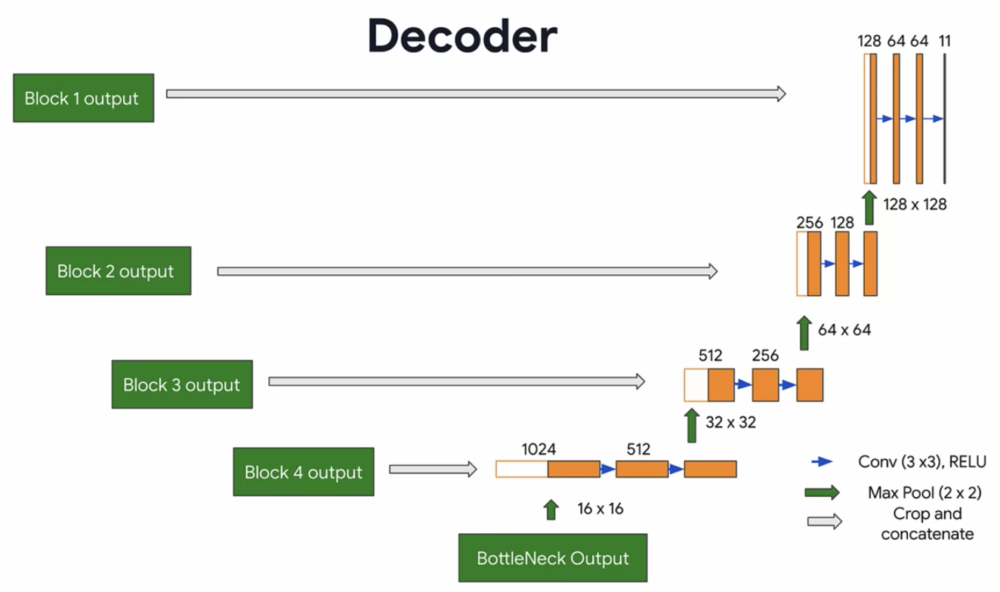!

In [10]:
# Decoder Utilities

def decoder_block(inputs, conv_output, n_filters=64, kernel_size=3, strides=3, dropout=0.3):
  '''
  defines the one decoder block of the UNet

  Args:
    inputs (tensor) -- batch of input features
    conv_output (tensor) -- features from an encoder block
    n_filters (int) -- number of filters
    kernel_size (int) -- kernel size
    strides (int) -- strides for the deconvolution/upsampling
    padding (string) -- "same" or "valid", tells if shape will be preserved by zero padding

  Returns:
    c (tensor) -- output features of the decoder block
  '''
  u = tf.keras.layers.Conv2DTranspose(n_filters, kernel_size, strides = strides, padding = 'same')(inputs)
  c = tf.keras.layers.concatenate([u, conv_output])
  c = tf.keras.layers.Dropout(dropout)(c)
  c = conv2d_block(c, n_filters, kernel_size=3)

  return c


def decoder(inputs, convs, output_channels):
  '''
  Defines the decoder of the UNet chaining together 4 decoder blocks. 
  
  Args:
    inputs (tensor) -- batch of input features
    convs (tuple) -- features from the encoder blocks
    output_channels (int) -- number of classes in the label map

  Returns:
    outputs (tensor) -- the pixel wise label map of the image
  '''
  
  f1, f2, f3, f4 = convs

  c6 = decoder_block(inputs, f4, n_filters=512, kernel_size=(3,3), strides=(2,2), dropout=0.3)
  c7 = decoder_block(c6, f3, n_filters=256, kernel_size=(3,3), strides=(2,2), dropout=0.3)
  c8 = decoder_block(c7, f2, n_filters=128, kernel_size=(3,3), strides=(2,2), dropout=0.3)
  c9 = decoder_block(c8, f1, n_filters=64, kernel_size=(3,3), strides=(2,2), dropout=0.3)

  outputs = tf.keras.layers.Conv2D(output_channels, (1, 1), activation='softmax')(c9)

  return outputs

### Putting it all together
You can finally build the UNet by chaining the encoder, bottleneck, and decoder. You will specify the number of output channels and in this particular set, that would be 3. That is because there are three possible labels for each pixel: 'pet', 'background', and 'outline'.

In [11]:
OUTPUT_CHANNELS = NUM_CLASSES

def unet():
  '''
  Defines the UNet by connecting the encoder, bottleneck and decoder.
  '''

  # specify the input shape
  inputs = tf.keras.layers.Input(shape=(128, 128,3,))

  # feed the inputs to the encoder
  encoder_output, convs = encoder(inputs)

  # feed the encoder output to the bottleneck
  bottle_neck = bottleneck(encoder_output)

  # feed the bottleneck and encoder block outputs to the decoder
  # specify the number of classes via the `output_channels` argument
  outputs = decoder(bottle_neck, convs, output_channels=OUTPUT_CHANNELS)
  
  # create the model
  model = tf.keras.Model(inputs=inputs, outputs=outputs)

  return model

# instantiate the model
model = unet()

# see the resulting model architecture
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 128, 128,  │          0 │ conv2d[0][0]      │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 128, 128,  │          0 │ conv2d_1[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64, 64,    │          0 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │     73,856 │ dropout[0][0]     │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 64, 64,    │          0 │ conv2d_2[0][0]    │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 32,    │          0 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │    295,168 │ dropout_1[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 32, 32,    │          0 │ conv2d_4[0][0]    │
│ (Activation)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │    590,080 │ activation_4[0][… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_5        │ (None, 32, 32,    │          0 │ conv2d_5[0][0]  

 Total params: 34,514,580 (131.66 MB)

 Trainable params: 34,514,580 (131.66 MB)

 Non-trainable params: 0 (0.00 B)

## Compile and Train the model
Now, all that is left to do is to compile and train the model. The loss you will use is sparse_categorical_crossentropy. The reason is because the network is trying to assign each pixel a label, just like multi-class prediction. In the true segmentation mask, each pixel has either a {0,1,2}. The network here is outputting three channels. Essentially, each channel is trying to learn to predict a class and sparse_categorical_crossentropy is the recommended loss for such a scenario.

In [14]:
# configure the optimizer, loss and metrics for training
opt=tf.keras.optimizers.Adam(learning_rate=0.001, epsilon=1e-7)
model.compile(optimizer=opt, 
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.01,
                                                 patience = 3,
                                                 factor = 0.25,
                                                 verbose = 1,
                                                 cooldown = 0,
                                                 min_lr = 0.00000001)

early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                 mode = 'max',
                                                 min_delta = 0.005,
                                                 patience = 10,
                                                 verbose = 1,
                                                 restore_best_weights = True)

In [15]:
# configure the training parameters and train the model

EPOCHS = 60

# 15 EPOCHS will take around 20 minutes to run
history = model.fit(train_dataset, 
                    epochs=EPOCHS,
                    validation_data=val_dataset,
                    callbacks=[early_stopper, reduce_lr]
                    )


Epoch 1/60
825/825 ━━━━━━━━━━━━━━━━━━━━ 691s 831ms/step - accuracy: 0.7921 - loss: 3.5485 - val_accuracy: 0.6960 - val_loss: 2.2258 - learning_rate: 0.0010
Epoch 2/60
825/825 ━━━━━━━━━━━━━━━━━━━━ 696s 844ms/step - accuracy: 0.7909 - loss: 0.7609 - val_accuracy: 0.6442 - val_loss: 1.2365 - learning_rate: 0.0010
Epoch 3/60
825/825 ━━━━━━━━━━━━━━━━━━━━ 744s 901ms/step - accuracy: 0.8165 - loss: 0.5984 - val_accuracy: 0.6314 - val_loss: 1.1989 - learning_rate: 0.0010
Epoch 4/60
825/825 ━━━━━━━━━━━━━━━━━━━━ 0s 826ms/step - accuracy: 0.8408 - loss: 0.4940
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
825/825 ━━━━━━━━━━━━━━━━━━━━ 744s 901ms/step - accuracy: 0.8408 - loss: 0.4940 - val_accuracy: 0.6155 - val_loss: 1.1634 - learning_rate: 0.0010
Epoch 5/60
825/825 ━━━━━━━━━━━━━━━━━━━━ 743s 901ms/step - accuracy: 0.8346 - loss: 0.5031 - val_accuracy: 0.7443 - val_loss: 0.8186 - learning_rate: 2.5000e-04
Epoch 6/60
825/825 ━━━━━━━━━━━━━━━━━━━━ 743s 900ms/step - accur

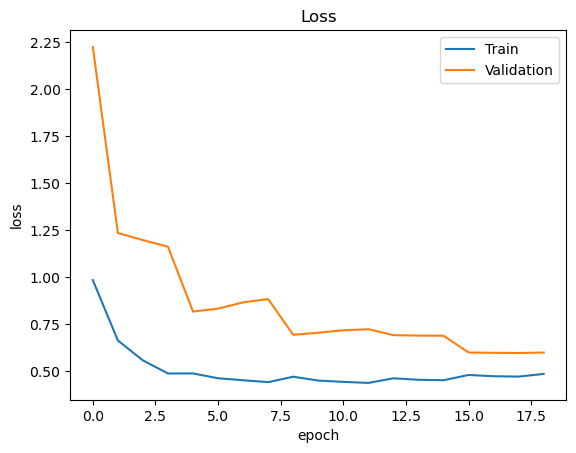

In [16]:
plt.plot(history.history["loss"], label = "Train")
plt.plot(history.history["val_loss"], label = "Validation")
plt.legend(loc = 'upper right')
plt.title("Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

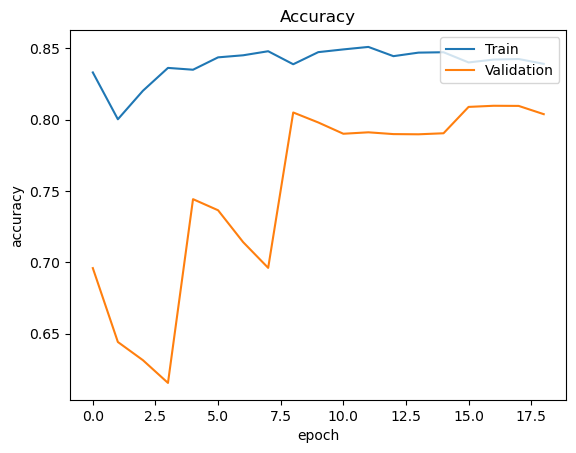

In [17]:
plt.plot(history.history["accuracy"], label = "Train")
plt.plot(history.history["val_accuracy"], label = "Validation")
plt.legend(loc = 'upper right')
plt.title("Accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.show()

## Guardar modelo completo y cargarlo en formato h5

In [18]:
model.save_weights('./model/Test8_UNET.weights.h5')

In [25]:
model.load_weights('./model/Test8_UNET.weights.h5')

## Guardar y Cargar modelo completo con tf.saved_model

In [19]:
tf.saved_model.save(model, './model/Test8_UNET_Rellis20_1')

INFO:tensorflow:Assets written to: ./model/Test8_UNET_Rellis20_1\assets


INFO:tensorflow:Assets written to: ./model/Test8_UNET_Rellis20_1\assets


In [12]:
tf.saved_model.load('./model/Test8_UNET_Rellis20_1')

<tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject at 0x20dccc9e940>

### Retrain model and save the best

In [17]:
#EPOCHS=3
#checkpoint_filepath ='./checkpoint/rellis3D_20_2/checkpoint.model.keras'
#tensorboard_filepath='./checkpoint/rellis3D_20_2/logs'

# save the model and weights for each epoch
#model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
#    checkpoint_filepath,
#    monitor="val_loss",
#    verbose=0,
#    save_best_only=True,
#    save_weights_only=False,
#    mode="min",
#    save_freq="epoch",
#    initial_value_threshold=None,
#)

In [18]:
# history = model.fit(train_dataset, validation_data=val_dataset, epochs=EPOCHS, callbacks=[mycallbacks])

Epoch 1/3
825/825 ━━━━━━━━━━━━━━━━━━━━ 4703s 6s/step - accuracy: 0.9610 - loss: 0.1133 - val_accuracy: 0.7781 - val_loss: 0.9928
Epoch 2/3
825/825 ━━━━━━━━━━━━━━━━━━━━ 4716s 6s/step - accuracy: 0.9615 - loss: 0.1121 - val_accuracy: 0.7633 - val_loss: 1.2573
Epoch 3/3
825/825 ━━━━━━━━━━━━━━━━━━━━ 4823s 6s/step - accuracy: 0.9618 - loss: 0.1111 - val_accuracy: 0.7901 - val_loss: 1.1711


In [19]:
#model.save_weights('./model/Test7_model2.weights.h5')

In [20]:
#tf.saved_model.save(model, './model/Test_7_Rellis20_2')

INFO:tensorflow:Assets written to: ./model/Test_7_Rellis20_2\assets


INFO:tensorflow:Assets written to: ./model/Test_7_Rellis20_2\assets


## Inferencia mediante superposición de mapa de colores
Las predicciones sin procesar del modelo representan un tensor de forma codificado en caliente (N, 512, 512, num_clases) donde cada uno de los num_clases (canales) es una máscara binaria correspondiente a una etiqueta predicha. Para visualizar los resultados, los trazamos como máscaras de segmentación RGB donde cada píxel está representado por un color único correspondiente a la etiqueta particular predicha. Podemos encontrar fácilmente el color correspondiente a cada etiqueta en el archivo human_colormap.mat proporcionado como parte del conjunto de datos. También trazaríamos una superposición de la máscara de segmentación RGB en la imagen de entrada, ya que esto nos ayuda a identificar las diferentes categorías presentes en la imagen de manera más intuitiva.

In [31]:
def infer(model, image_tensor):
    predictions = model.predict(np.expand_dims((image_tensor), axis=0),verbose=0)
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    return predictions


def decode_segmentation_masks(mask, colormap, n_classes):
    r = np.zeros_like(mask).astype(np.uint8)
    g = np.zeros_like(mask).astype(np.uint8)
    b = np.zeros_like(mask).astype(np.uint8)
    for l in range(0, n_classes):
        idx = mask == l
        r[idx] = colormap[l, 0]
        g[idx] = colormap[l, 1]
        b[idx] = colormap[l, 2]
    rgb = np.stack([r, g, b], axis=2)
    return rgb


def get_overlay(image, colored_mask):
    image = keras.utils.array_to_img(image)
    image = np.array(image).astype(np.uint8)
    overlay = cv2.addWeighted(image, 0.35, colored_mask, 0.65, 0)
    return overlay


def plot_samples_matplotlib(display_list, figsize=(5, 3)):
    _, axes = plt.subplots(nrows=1, ncols=len(display_list), figsize=figsize)
    for i in range(len(display_list)):
        if display_list[i].shape[-1] == 3:
            axes[i].imshow(keras.utils.array_to_img(display_list[i]))
        else:
            axes[i].imshow(display_list[i])
    plt.show()


def plot_predictions(images_list, colormap, model):
    for image_file in images_list:
        image_tensor = read_image(image_file)
        prediction_mask = infer(image_tensor=image_tensor, model=model)
        #prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, 20)
        prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, NUM_CLASSES)
        overlay = get_overlay(image_tensor, prediction_colormap)
        plot_samples_matplotlib(
            [image_tensor, overlay, prediction_colormap], figsize=(18, 14)
        )
    

### Estudio del mapa de colores para que coincida con el del dataset original

In [21]:
IDs =    [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 17, 18, 19, 23, 27, 31, 33, 34]
Groups = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19)

# ORIGINAL DATASET
CLASSES = ("void", "dirt", "grass", "tree", "pole", "water", "sky", "vehicle", 
            "object", "asphalt", "building", "log", "person", "fence", "bush", 
            "concrete", "barrier", "puddle", "mud", "rubble")

PALETTE = np.array([[0, 0, 0], [108, 64, 20], [0, 102, 0], [0, 255, 0], [0, 153, 153], 
            [0, 128, 255], [0, 0, 255], [255, 255, 0], [255, 0, 127], [64, 64, 64], 
            [255, 0, 0], [102, 0, 0], [204, 153, 255], [102, 0, 204], [255, 153, 204], 
            [170, 170, 170], [41, 121, 255], [134, 255, 239], [99, 66, 34], [110, 22, 138]])

print(type(PALETTE))
print(PALETTE)


<class 'numpy.ndarray'>
[[  0   0   0]
 [108  64  20]
 [  0 102   0]
 [  0 255   0]
 [  0 153 153]
 [  0 128 255]
 [  0   0 255]
 [255 255   0]
 [255   0 127]
 [ 64  64  64]
 [255   0   0]
 [102   0   0]
 [204 153 255]
 [102   0 204]
 [255 153 204]
 [170 170 170]
 [ 41 121 255]
 [134 255 239]
 [ 99  66  34]
 [110  22 138]]


## Inferencia en conjunto Train - con superposición de mapa de colores sobre RGB

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


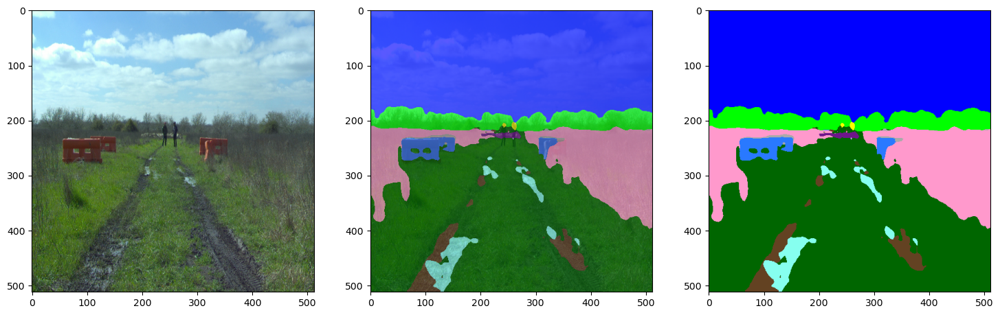

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step


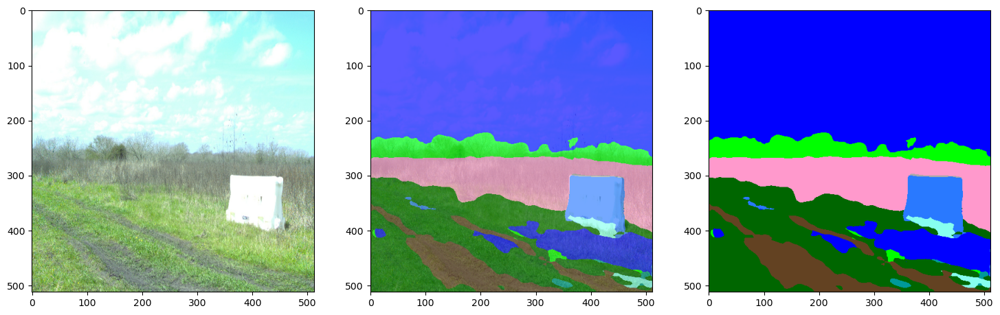

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step


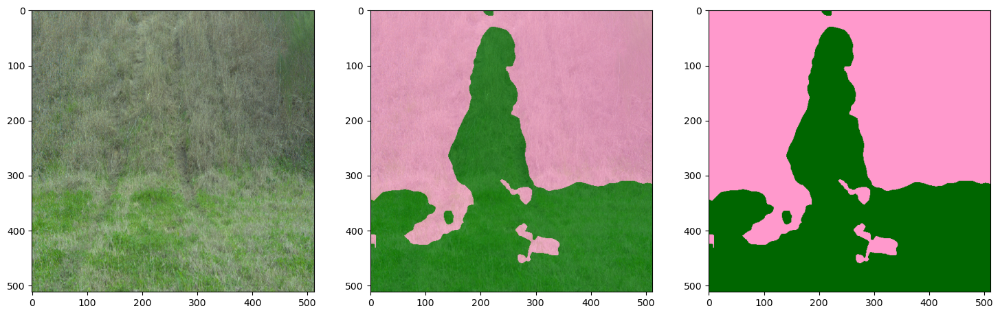

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step


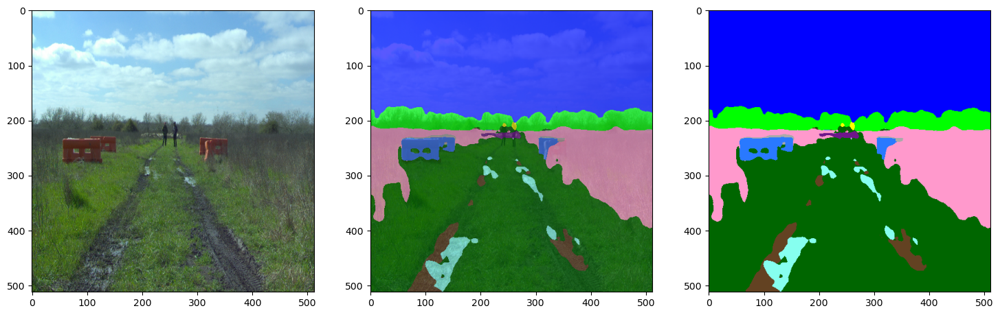

In [28]:
# DeepLabV3+
#plot_predictions(train_images[:4], PALETTE, model=model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 407ms/step


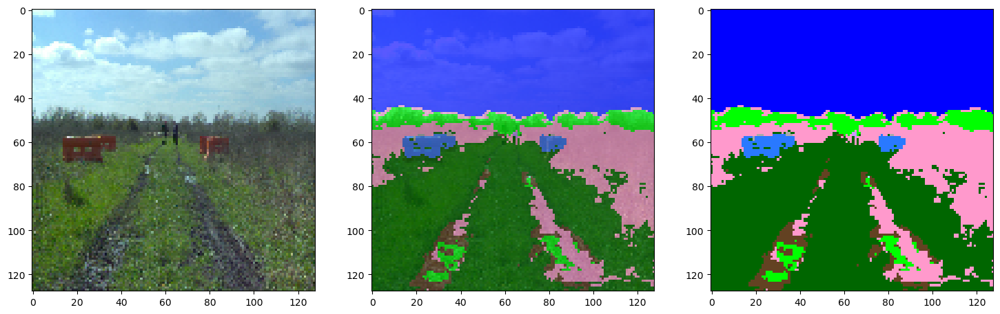

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


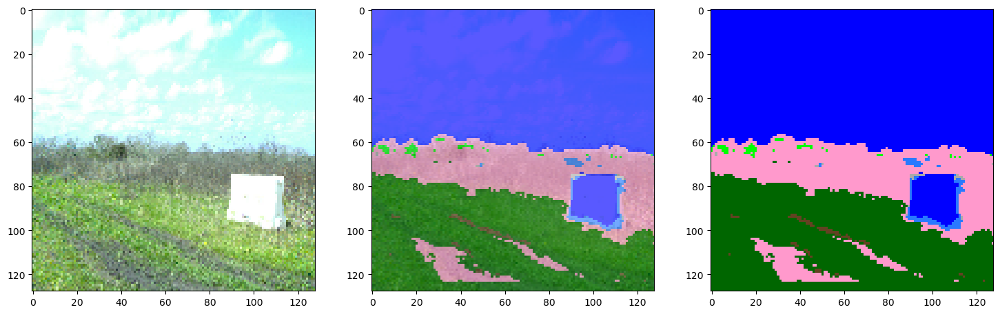

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


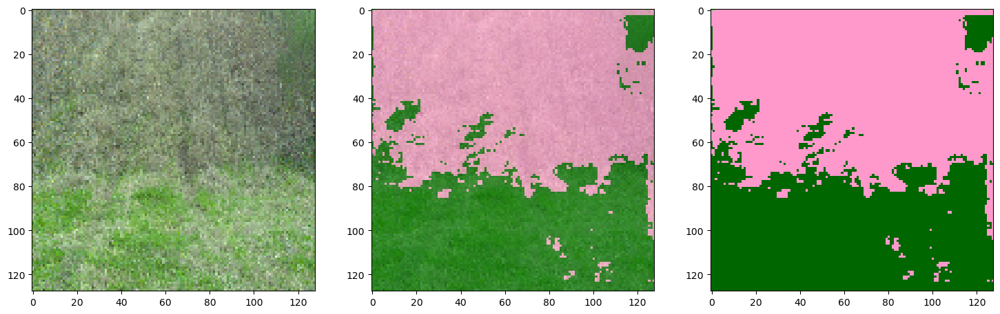

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step


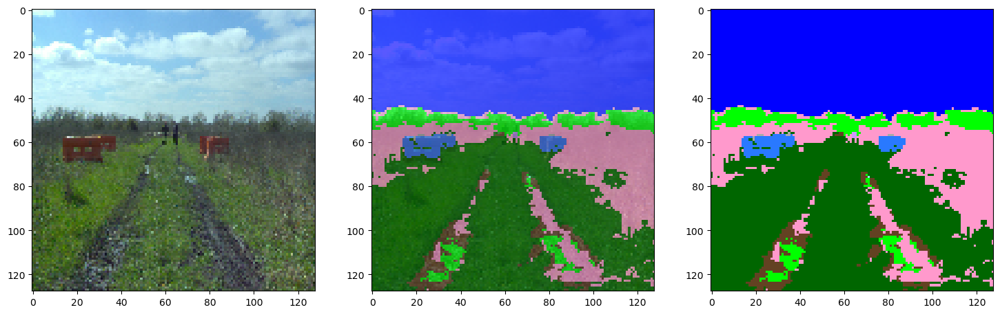

In [22]:
plot_predictions(train_images[:4], PALETTE, model=model)

## Inferencia en conjunto Test - con superposición de mapa de colores sobre RGB
Puede utilizar el modelo entrenado alojado en Hugging Face Hub y probar la demostración en Hugging Face Spaces.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step


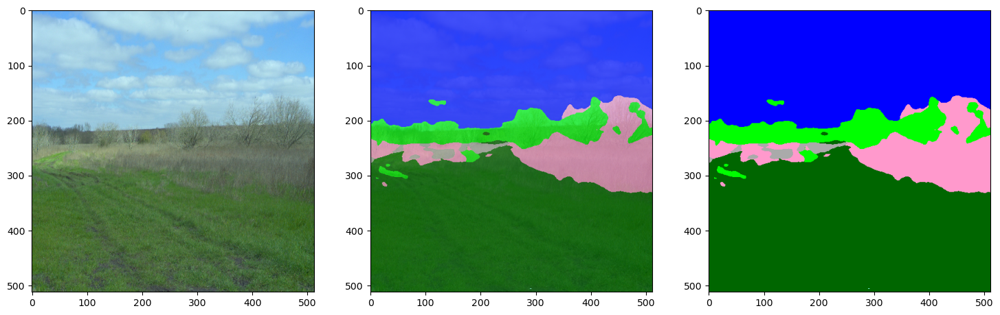

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step


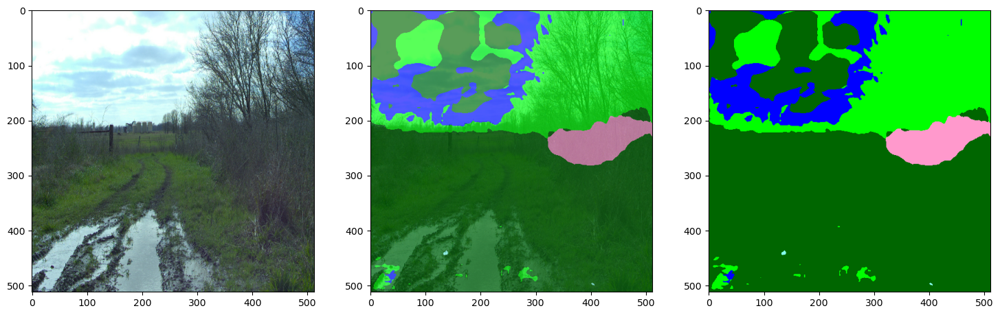

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


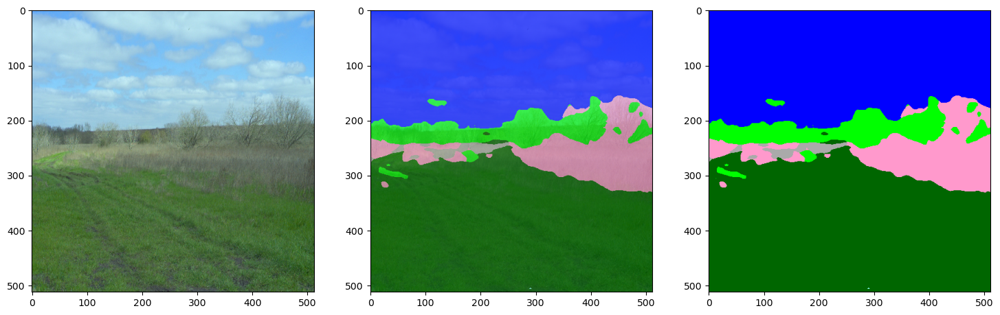

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


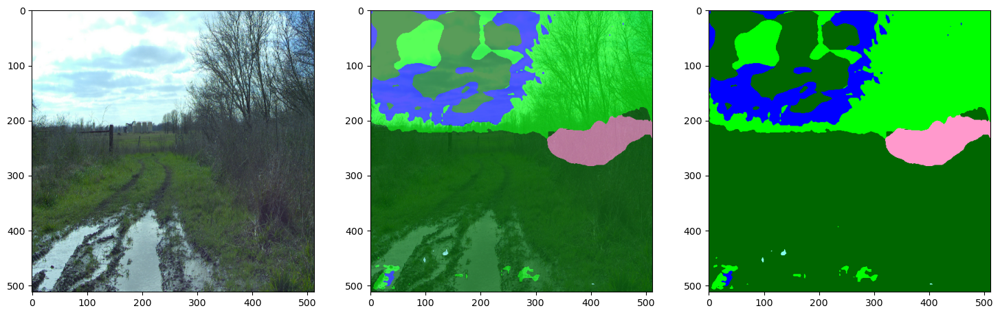

In [29]:
#DeepLabV3+
#plot_predictions(test_images[:4], PALETTE, model=model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step


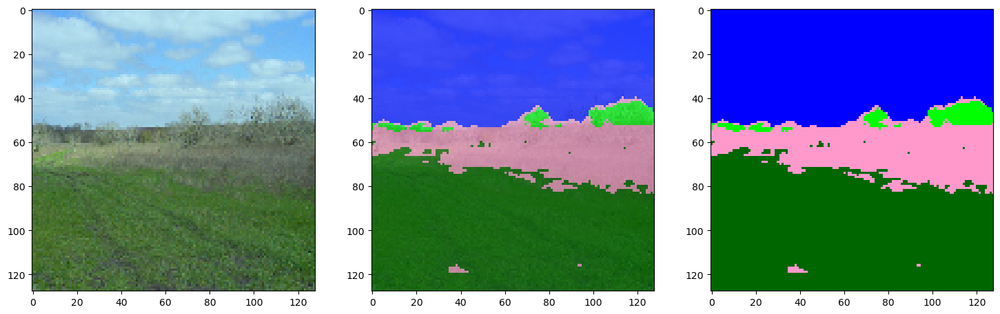

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step


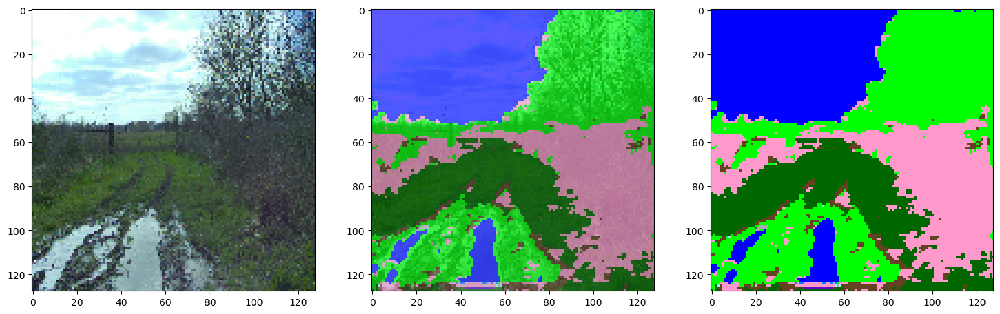

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


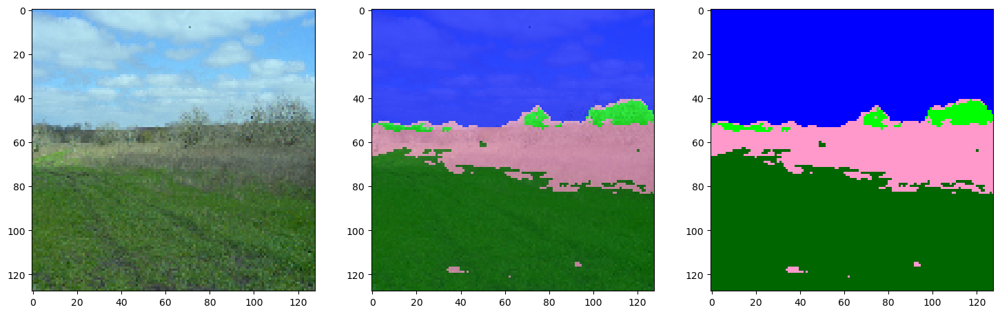

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step


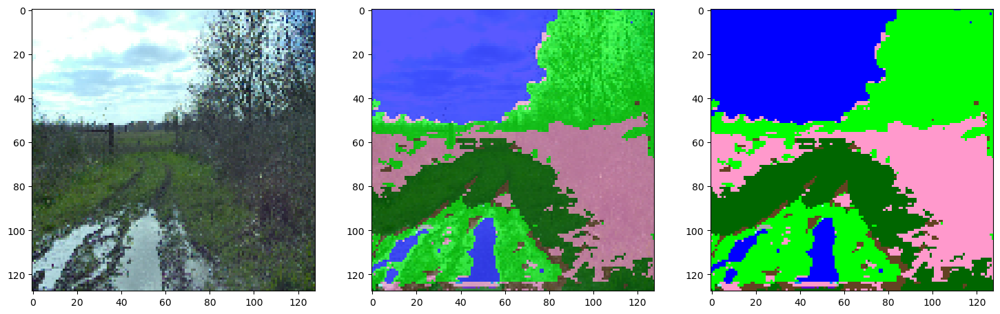

In [23]:
plot_predictions(test_images[:4], PALETTE, model=model)

## Guardar modelo con predicciones

In [24]:
# tf.saved_model.save(model, './model/Test_4.2_RDeepLabV3+_Rellis20_pred')

INFO:tensorflow:Assets written to: ./model/Test3_RDeepLabV3+_RellisAll_pred\assets


INFO:tensorflow:Assets written to: ./model/Test3_RDeepLabV3+_RellisAll_pred\assets


## Inferencia comparando la máscara GT RGB con la predicción convertida a RGB con mapa de colores

#### Conjunto de test cargado anteriormente
- test_images = sorted(glob(os.path.join(TEST_DIR, "images/*")))
- test_masks = sorted(glob(os.path.join(TEST_DIR, "labels/*")))
- test_maskscolors = sorted(glob(os.path.join(TEST_DIR, "masks_colors/*")))

In [24]:
# Seleccionar imágenes RGB del conjunto de test
for filename in test_images[:4]:
    print(filename)

./rellis20/test\images\frame000000-1581623790_349.jpg
./rellis20/test\images\frame000000-1581624652_750.jpg
./rellis20/test\images\frame000002-1581623790_549.jpg
./rellis20/test\images\frame000002-1581624652_949.jpg


In [25]:
# Seleccionar máscaras ID del conjunto de test
for filename in test_masks[:4]:
    print(filename)

./rellis20/test\labels\frame000000-1581623790_349_20.png
./rellis20/test\labels\frame000000-1581624652_750_20.png
./rellis20/test\labels\frame000002-1581623790_549_20.png
./rellis20/test\labels\frame000002-1581624652_949_20.png


In [26]:
for filename in test_maskscolors[:4]:
    print(filename)

./rellis20/test\masks_colors\frame000000-1581623790_349.png
./rellis20/test\masks_colors\frame000000-1581624652_750.png
./rellis20/test\masks_colors\frame000002-1581623790_549.png
./rellis20/test\masks_colors\frame000002-1581624652_949.png


In [27]:
# Predicción de MaskID - Mostrar RGB vs GT MaskID original vs Predicción maskID
def plot_MaskID_GTvsPred(images_list, mask_id, model):
    aux=0
    for image_file in images_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        mask_id_gt = read_image(mask_id[aux], mask=True)                 # Ground Truth MaskID
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        
        #prediction_colormap = decode_segmentation_masks(prediction_mask, colormap, NUM_CLASSES)
        #overlay = get_overlay(image_tensor, prediction_colormap)
        plot_samples_matplotlib(
            [image_tensor, mask_id_gt, pred_mask_id], figsize=(18, 14)
        )
        aux+=1
        
# Predicción de MaskColor - Mostrar RGB vs GT MaskColor vs Predicción maskID superpuesta con mapa de colores
def plot_MaskColor_GTvsPred(images_list, mask_color, model):
    aux=0
    for image_file in images_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        mask_color_gt = read_image(mask_color[aux])                      # Ground Truth MaskColor
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        pred_mask_color = decode_segmentation_masks(pred_mask_id, PALETTE, NUM_CLASSES)   # Convert predicted maskID to maskcolor

        plot_samples_matplotlib(
            [image_tensor, mask_color_gt, pred_mask_color], figsize=(18, 14)
        )
        aux+=1
     

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


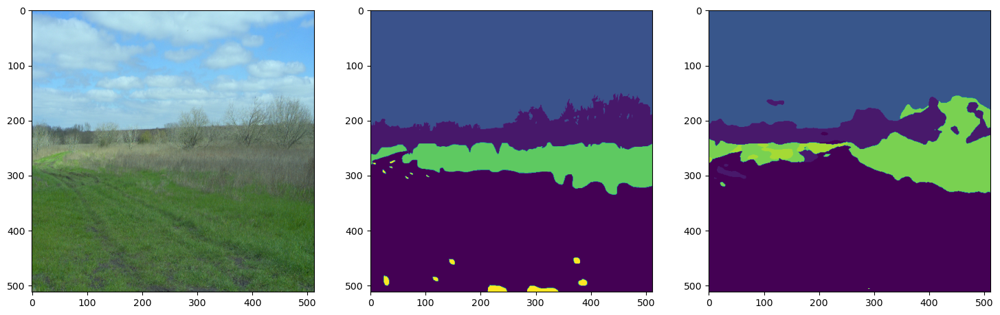

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step


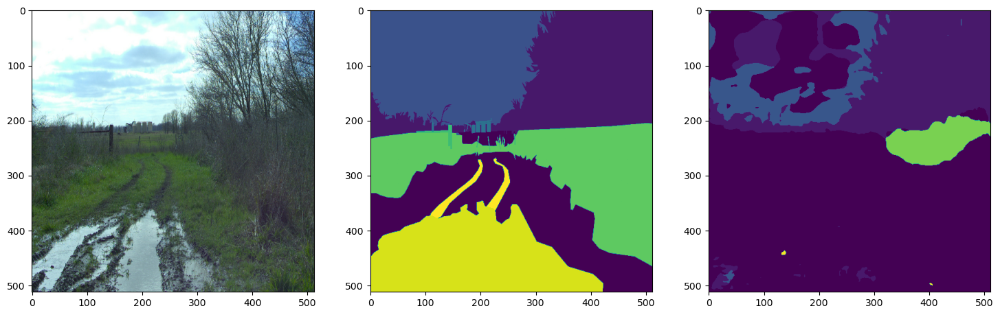

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step


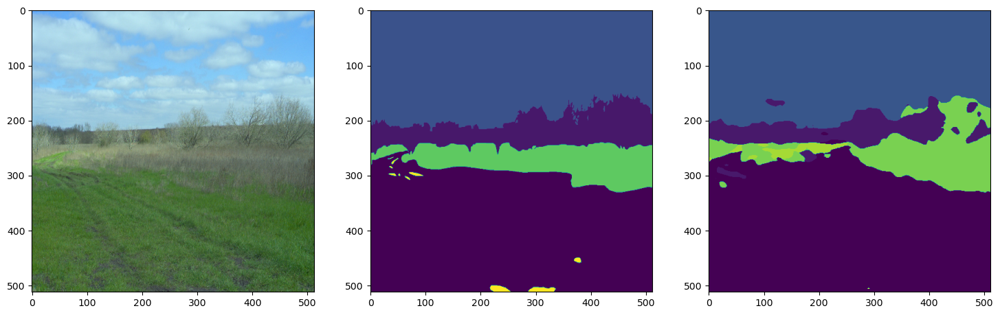

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step


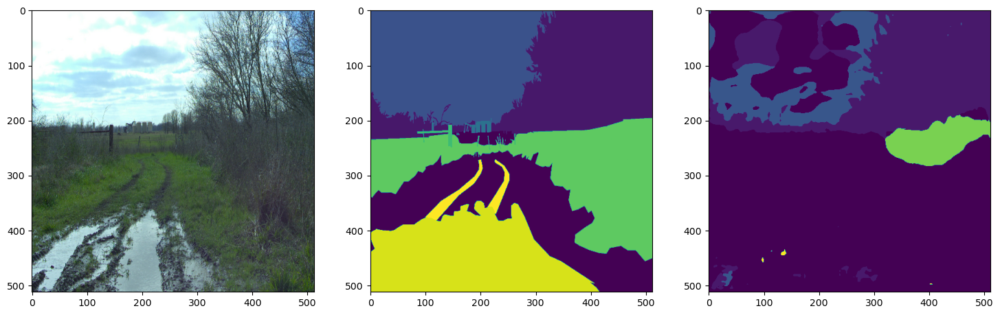

In [34]:
# DeepLabV3+
# plot_MaskID_GTvsPred(test_images[:4], test_masks[:4], model=model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step


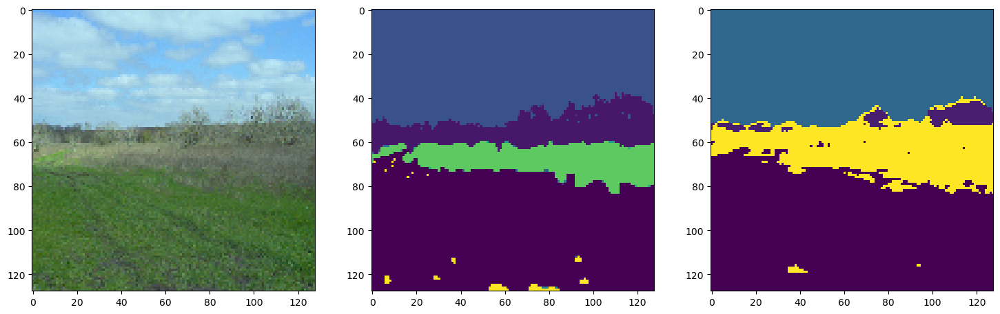

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


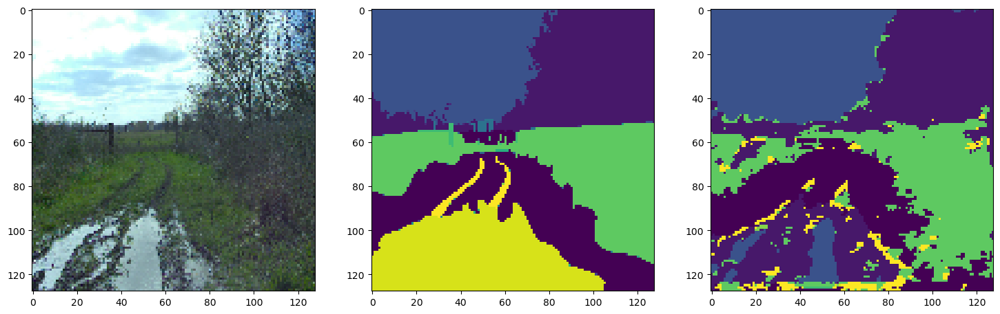

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


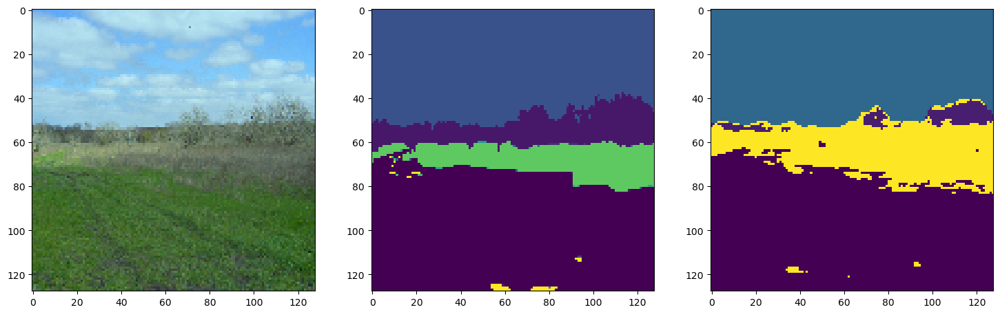

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


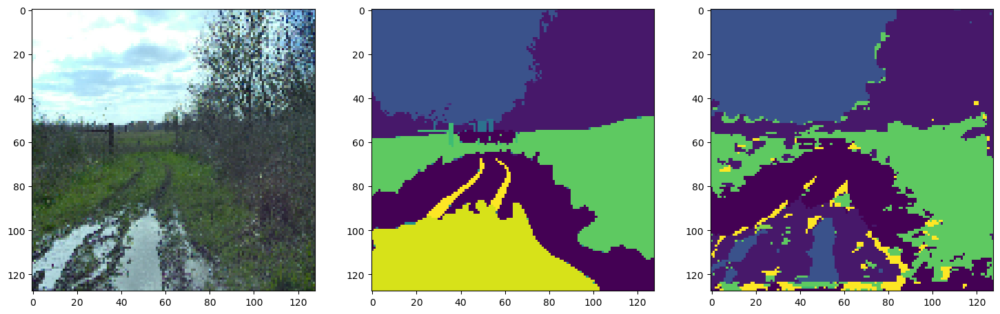

In [28]:
plot_MaskID_GTvsPred(test_images[:4], test_masks[:4], model=model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step


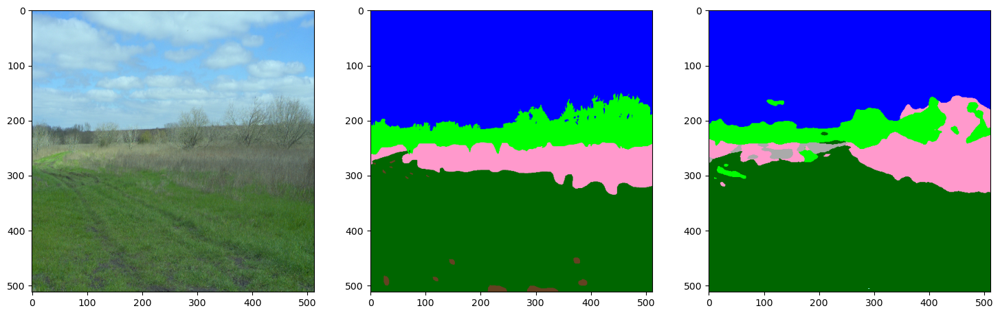

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 174ms/step


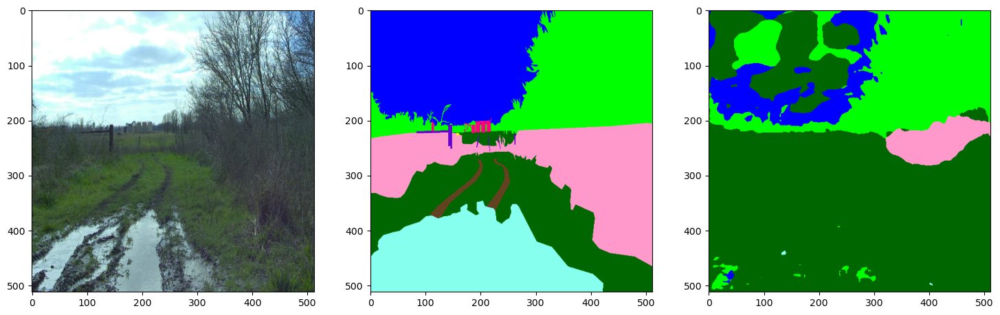

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step


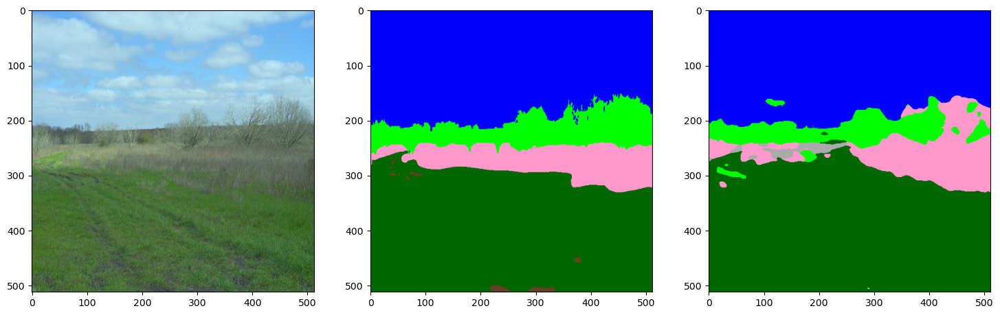

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step


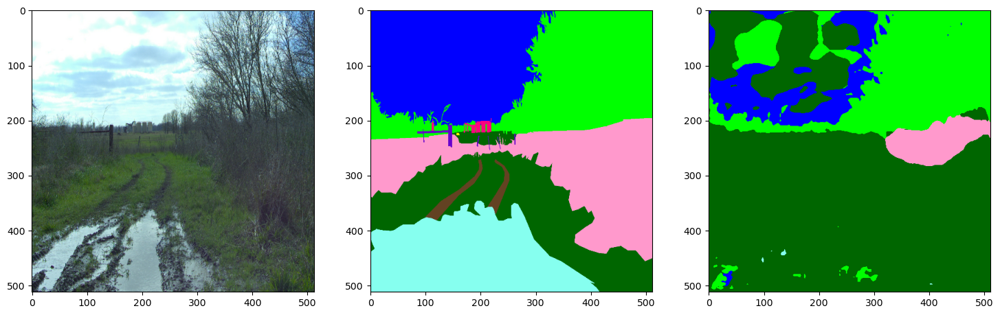

In [35]:
# DeepLabV3+
# plot_MaskColor_GTvsPred(test_images[:4], test_maskscolors[:4], model=model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


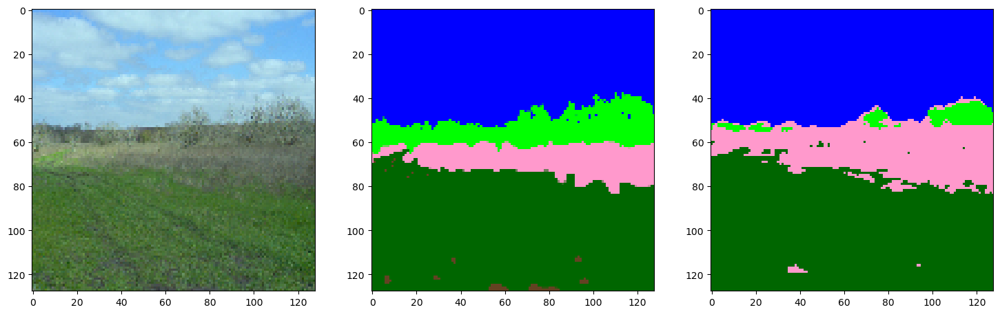

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


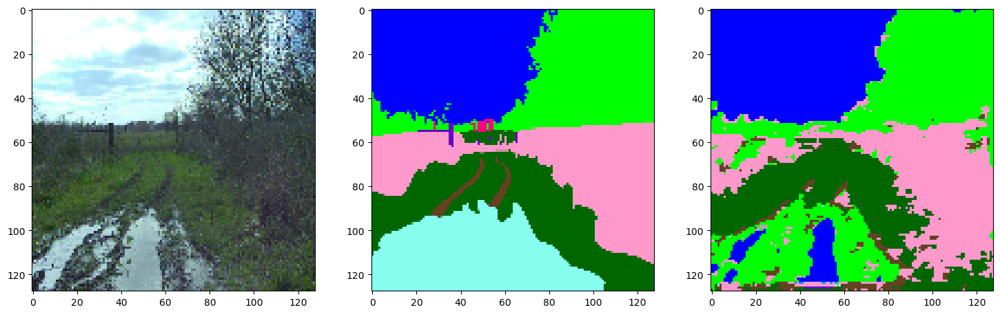

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


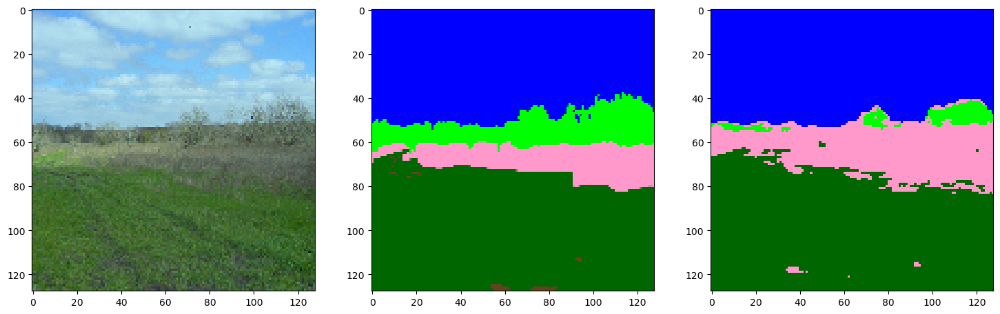

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


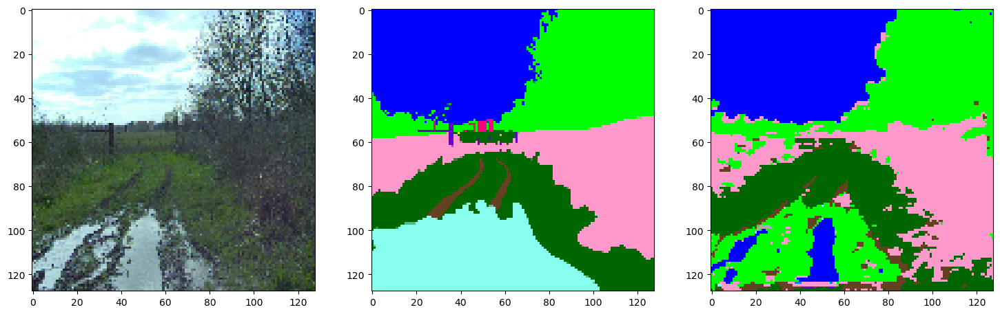

In [29]:
plot_MaskColor_GTvsPred(test_images[:4], test_maskscolors[:4], model=model)

## Inferencia en conjunto de Test completo

In [30]:
def inference_maskID(RGB_image_list, model):
    aux=0
    pred_masks_id=[]
    for image_file in RGB_image_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        pred_masks_id.append(pred_mask_id)
        aux+=1
    return pred_masks_id

def inference_maskColor(RGB_image_list, model):
    aux=0
    pred_masks_color=[]
    for image_file in RGB_image_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        pred_mask_color = decode_segmentation_masks(pred_mask_id, PALETTE, NUM_CLASSES)   # Convert predicted maskID to maskcolor
        pred_masks_color.append(pred_mask_color)
        aux+=1
    return pred_masks_color

In [32]:
pred_masksID = inference_maskID(test_images, model)
pred_masksColor = inference_maskColor(test_images,model)

### Check the RGB and masks image shapes

In [33]:
# RGB Test image
RGB0 = read_image(test_images[0])   
print(RGB0.shape)

# Test GT maskID
maskID0 = read_image(test_masks[0], mask=True)   
print(maskID0.shape)

# Test GT maskColor
maskColor0 = read_image(test_maskscolors[0])
print(maskColor0.shape)

# Predicted test maskID
print(pred_masksID[0].shape)

# Predicted test maskColor
print(pred_masksColor[0].shape)

(128, 128, 3)
(128, 128, 1)
(128, 128, 3)
(128, 128)
(128, 128, 3)


## Métricas

In [34]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def extract_mask_label(mask, pred, ind):
    maskID = [(mask == ind)]
    predID = [(pred == ind)]
    mask_ID = np.stack(maskID, axis=-1).astype('float').flatten()
    pred_maskID = np.stack(predID, axis=-1).astype('float').flatten()
    return mask_ID, pred_maskID
    
def plot_confusion_matrix(cm, labels):
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    disp.plot()
    plt.show()


In [35]:
def compute_metrics(confusionmatrix):
    FP = confusionmatrix.sum(axis=0) - np.diag(confusionmatrix)  
    FN = confusionmatrix.sum(axis=1) - np.diag(confusionmatrix)
    TP = np.diag(confusionmatrix)
    TN = confusionmatrix.sum() - (FP + FN + TP)
    
    # Precision or positive predictive value
    PPV = TP/(TP+FP)    # Precision
    
    # Sensitivity, hit rate, recall, or true positive rate
    TPR = TP/(TP+FN)    # Recall
    
    # F1-Score
    F1_Score=(2*(PPV*TPR))/(PPV+TPR)
    
    # Specificity or true negative rate
    TNR = TN/(TN+FP) 
    
    # Negative predictive value
    NPV = TN/(TN+FN)
    
    # Fall out or false positive rate
    FPR = FP/(FP+TN)
    # False negative rate
    FNR = FN/(TP+FN)
    # False discovery rate
    FDR = FP/(TP+FP)
    
    # Overall accuracy
    ACC = (TP+TN)/(TP+FP+FN+TN)

    # Para la clase 
    print('TP:', TP)
    print('TN:', TN)
    print('FP:', FP)
    print('FN:', FN)
    
    print('+ predictive value (Precision): ',PPV) 
    print('- predictive value: ', NPV)
    print('Recall: ', TPR) 
    print('F1-Score: ', F1_Score)
    print('True + rate: ', TNR)
    print('False + rate: ', FPR)
    print('False - rate', FNR)
    print('False discovery rate: ', FDR)
    print('Overall Accuracy: ', ACC)
    return 

De la primera imagen cargada del conjunto de test, sabemos seguro que tiene pixels de la clase grass (id=2) y sky (id=6). Tambien sabemos que no tiene pixeles de la clase vehicle (id=7)

In [37]:
# first image
maskID = read_image(test_masks[0], mask=True)   
maskID0 = np.reshape(maskID,(IMAGE_SIZE,IMAGE_SIZE))
pred_maskID0 = np.reshape(pred_masksID[0],(IMAGE_SIZE,IMAGE_SIZE))

print(maskID0.shape)
print(pred_maskID0.shape)

print(maskID0)
print(pred_maskID0)

# Seleccionar la máscara GT y predicción de la clase grass (id=2)
gra_maskID, pred_gra_maskID = extract_mask_label(maskID0, pred_maskID0, 2)

print(gra_maskID.shape)
print(gra_maskID)
print(pred_gra_maskID.shape)
print(pred_gra_maskID)

# Seleccionar la máscara GT y predicción de la clase sky (id=6)
maskID = [(maskID0 == 6)]
pred_maskID = [(pred_maskID0 == 6)]
sky_maskID = np.stack(maskID, axis=-1).astype('float').flatten()
pred_sky_maskID = np.stack(pred_maskID, axis=-1).astype('float').flatten()

# Seleccionar la máscara GT y predicción de la clase vehicle (id=7)
maskID = [(maskID0 == 7)]
pred_maskID = [(pred_maskID0 == 7)]
veh_maskID = np.stack(maskID, axis=-1).astype('float').flatten()
pred_veh_maskID = np.stack(pred_maskID, axis=-1).astype('float').flatten()

#IDs =    [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 17, 18, 19, 23, 27, 31, 33, 34]
#Groups = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19)
#CLASSES = ("void", "dirt", "grass", "tree", "pole", "water", "sky", "vehicle", 
#            "object", "asphalt", "building", "log", "person", "fence", "bush", 
#            "concrete", "barrier", "puddle", "mud", "rubble")

(128, 128)
(128, 128)
[[6. 6. 6. ... 6. 6. 6.]
 [6. 6. 6. ... 6. 6. 6.]
 [6. 6. 6. ... 6. 6. 6.]
 ...
 [2. 2. 2. ... 2. 2. 2.]
 [2. 2. 2. ... 2. 2. 2.]
 [2. 2. 2. ... 2. 2. 2.]]
[[6 6 6 ... 6 6 6]
 [6 6 6 ... 6 6 6]
 [6 6 6 ... 6 6 6]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
(16384,)
[0. 0. 0. ... 1. 1. 1.]
(16384,)
[0. 0. 0. ... 1. 1. 1.]


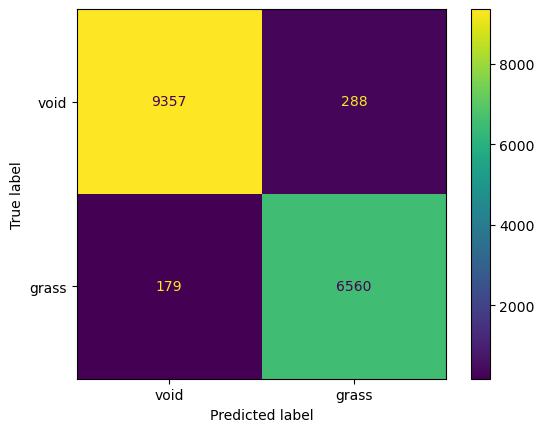

TP: [9357 6560]
TN: [6560 9357]
FP: [179 288]
FN: [288 179]
+ predictive value (Precision):  [0.98122903 0.95794393]
- predictive value:  [0.95794393 0.98122903]
Recall:  [0.97013997 0.9734382 ]
F1-Score:  [0.97565299 0.96562891]
True + rate:  [0.9734382  0.97013997]
False + rate:  [0.0265618  0.02986003]
False - rate [0.02986003 0.0265618 ]
False discovery rate:  [0.01877097 0.04205607]
Overall Accuracy:  [0.97149658 0.97149658]


In [38]:
# Para la clase 2 grass
conf_matrix = confusion_matrix(gra_maskID, pred_gra_maskID)
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[2]))
compute_metrics(conf_matrix)

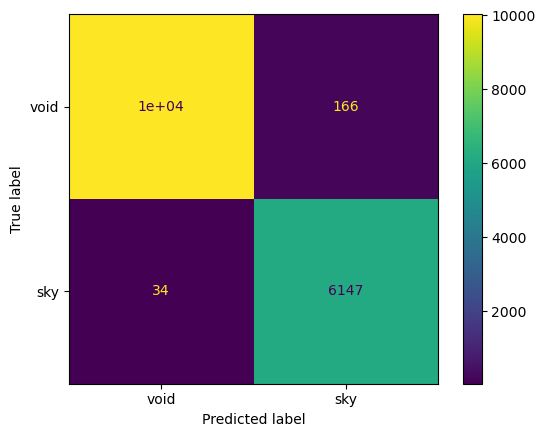

TP: [10037  6147]
TN: [ 6147 10037]
FP: [ 34 166]
FN: [166  34]
+ predictive value (Precision):  [0.99662397 0.97370505]
- predictive value:  [0.97370505 0.99662397]
Recall:  [0.98373028 0.99449927]
F1-Score:  [0.99013515 0.98399232]
True + rate:  [0.99449927 0.98373028]
False + rate:  [0.00550073 0.01626972]
False - rate [0.01626972 0.00550073]
False discovery rate:  [0.00337603 0.02629495]
Overall Accuracy:  [0.98779297 0.98779297]


In [39]:
# Para la clase 6 sky 
conf_matrix = confusion_matrix(sky_maskID, pred_sky_maskID)
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[6]))
compute_metrics(conf_matrix)

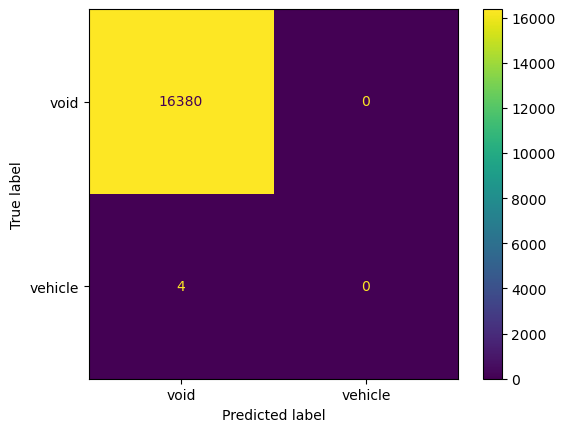

TP: [16380     0]
TN: [    0 16380]
FP: [4 0]
FN: [0 4]
+ predictive value (Precision):  [0.99975586        nan]
- predictive value:  [       nan 0.99975586]
Recall:  [1. 0.]
F1-Score:  [0.99987791        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00024414        nan]
Overall Accuracy:  [0.99975586 0.99975586]


In [40]:
# Para la clase 7 vehicle 
conf_matrix = confusion_matrix(veh_maskID, pred_veh_maskID)
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[7]))
compute_metrics(conf_matrix)

## Metrics for all labels in the same image

In [41]:
# first image
maskID = read_image(test_masks[0], mask=True)   
maskID0 = np.reshape(maskID,(IMAGE_SIZE,IMAGE_SIZE))
pred_maskID0 = np.reshape(pred_masksID[0],(IMAGE_SIZE,IMAGE_SIZE))

gtmaskID0, p_maskID0 = extract_mask_label(maskID0, pred_maskID0, 0)
gtmaskID1, p_maskID1 = extract_mask_label(maskID0, pred_maskID0, 1)
gtmaskID2, p_maskID2 = extract_mask_label(maskID0, pred_maskID0, 2)
gtmaskID3, p_maskID3 = extract_mask_label(maskID0, pred_maskID0, 3)
gtmaskID4, p_maskID4 = extract_mask_label(maskID0, pred_maskID0, 4)
gtmaskID5, p_maskID5 = extract_mask_label(maskID0, pred_maskID0, 5)
gtmaskID6, p_maskID6 = extract_mask_label(maskID0, pred_maskID0, 6)
gtmaskID7, p_maskID7 = extract_mask_label(maskID0, pred_maskID0, 7)
gtmaskID8, p_maskID8 = extract_mask_label(maskID0, pred_maskID0, 8)
gtmaskID9, p_maskID9 = extract_mask_label(maskID0, pred_maskID0, 9)
gtmaskID10, p_maskID10 = extract_mask_label(maskID0, pred_maskID0, 10)
gtmaskID11, p_maskID11 = extract_mask_label(maskID0, pred_maskID0, 11)
gtmaskID12, p_maskID12 = extract_mask_label(maskID0, pred_maskID0, 12)
gtmaskID13, p_maskID13 = extract_mask_label(maskID0, pred_maskID0, 13)
gtmaskID14, p_maskID14 = extract_mask_label(maskID0, pred_maskID0, 14)
gtmaskID15, p_maskID15 = extract_mask_label(maskID0, pred_maskID0, 15)
gtmaskID16, p_maskID16 = extract_mask_label(maskID0, pred_maskID0, 16)
gtmaskID17, p_maskID17 = extract_mask_label(maskID0, pred_maskID0, 17)
gtmaskID18, p_maskID18 = extract_mask_label(maskID0, pred_maskID0, 18)
gtmaskID19, p_maskID19 = extract_mask_label(maskID0, pred_maskID0, 19)


In [42]:
# void da error
conf_matrix = confusion_matrix(gtmaskID0.flatten(), p_maskID0.flatten())
#plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[0]))
compute_metrics(conf_matrix)

TP: [16384]
TN: [0]
FP: [0]
FN: [0]
+ predictive value (Precision):  [1.]
- predictive value:  [nan]
Recall:  [1.]
F1-Score:  [1.]
True + rate:  [nan]
False + rate:  [nan]
False - rate [0.]
False discovery rate:  [0.]
Overall Accuracy:  [1.]


In [43]:
# dirt da error
conf_matrix = confusion_matrix(gtmaskID1.flatten(), p_maskID1.flatten())
#plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[1]))
compute_metrics(conf_matrix)

TP: [16384]
TN: [0]
FP: [0]
FN: [0]
+ predictive value (Precision):  [1.]
- predictive value:  [nan]
Recall:  [1.]
F1-Score:  [1.]
True + rate:  [nan]
False + rate:  [nan]
False - rate [0.]
False discovery rate:  [0.]
Overall Accuracy:  [1.]


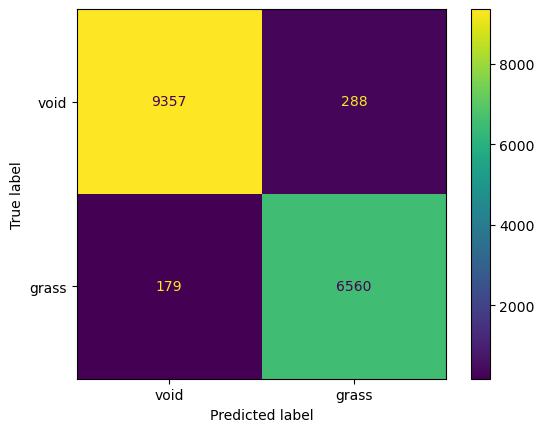

TP: [9357 6560]
TN: [6560 9357]
FP: [179 288]
FN: [288 179]
+ predictive value (Precision):  [0.98122903 0.95794393]
- predictive value:  [0.95794393 0.98122903]
Recall:  [0.97013997 0.9734382 ]
F1-Score:  [0.97565299 0.96562891]
True + rate:  [0.9734382  0.97013997]
False + rate:  [0.0265618  0.02986003]
False - rate [0.02986003 0.0265618 ]
False discovery rate:  [0.01877097 0.04205607]
Overall Accuracy:  [0.97149658 0.97149658]


In [44]:
# grass
conf_matrix = confusion_matrix(gtmaskID2.flatten(), p_maskID2.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[2]))
compute_metrics(conf_matrix)

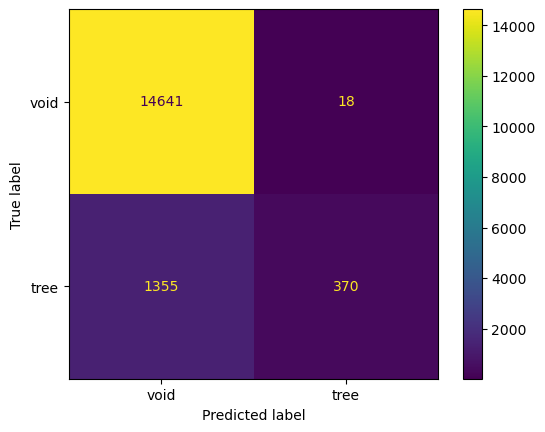

TP: [14641   370]
TN: [  370 14641]
FP: [1355   18]
FN: [  18 1355]
+ predictive value (Precision):  [0.91529132 0.95360825]
- predictive value:  [0.95360825 0.91529132]
Recall:  [0.99877209 0.21449275]
F1-Score:  [0.95521122 0.35021297]
True + rate:  [0.21449275 0.99877209]
False + rate:  [0.78550725 0.00122791]
False - rate [0.00122791 0.78550725]
False discovery rate:  [0.08470868 0.04639175]
Overall Accuracy:  [0.91619873 0.91619873]


In [45]:
# tree
conf_matrix = confusion_matrix(gtmaskID3.flatten(), p_maskID3.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[3]))
compute_metrics(conf_matrix)

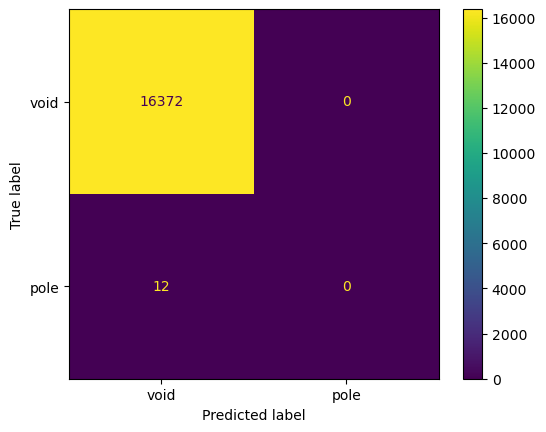

TP: [16372     0]
TN: [    0 16372]
FP: [12  0]
FN: [ 0 12]
+ predictive value (Precision):  [0.99926758        nan]
- predictive value:  [       nan 0.99926758]
Recall:  [1. 0.]
F1-Score:  [0.99963365        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00073242        nan]
Overall Accuracy:  [0.99926758 0.99926758]


In [46]:
# pole
conf_matrix = confusion_matrix(gtmaskID4.flatten(), p_maskID4.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[4]))
compute_metrics(conf_matrix)

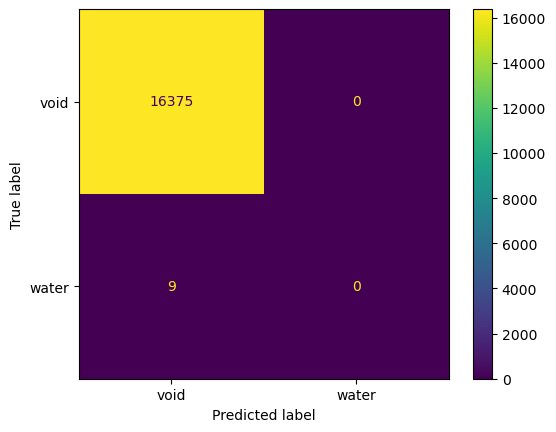

TP: [16375     0]
TN: [    0 16375]
FP: [9 0]
FN: [0 9]
+ predictive value (Precision):  [0.99945068        nan]
- predictive value:  [       nan 0.99945068]
Recall:  [1. 0.]
F1-Score:  [0.99972527        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00054932        nan]
Overall Accuracy:  [0.99945068 0.99945068]


In [47]:
# water
conf_matrix = confusion_matrix(gtmaskID5.flatten(), p_maskID5.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[5]))
compute_metrics(conf_matrix)

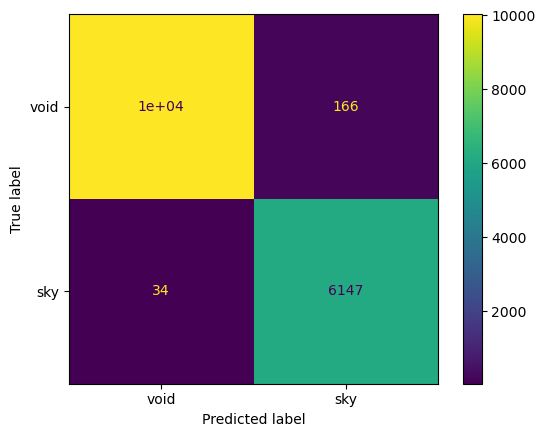

TP: [10037  6147]
TN: [ 6147 10037]
FP: [ 34 166]
FN: [166  34]
+ predictive value (Precision):  [0.99662397 0.97370505]
- predictive value:  [0.97370505 0.99662397]
Recall:  [0.98373028 0.99449927]
F1-Score:  [0.99013515 0.98399232]
True + rate:  [0.99449927 0.98373028]
False + rate:  [0.00550073 0.01626972]
False - rate [0.01626972 0.00550073]
False discovery rate:  [0.00337603 0.02629495]
Overall Accuracy:  [0.98779297 0.98779297]


In [48]:
# sky
conf_matrix = confusion_matrix(gtmaskID6.flatten(), p_maskID6.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[6]))
compute_metrics(conf_matrix)

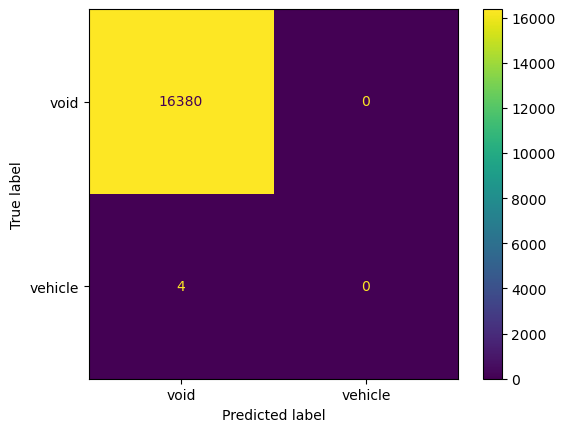

TP: [16380     0]
TN: [    0 16380]
FP: [4 0]
FN: [0 4]
+ predictive value (Precision):  [0.99975586        nan]
- predictive value:  [       nan 0.99975586]
Recall:  [1. 0.]
F1-Score:  [0.99987791        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00024414        nan]
Overall Accuracy:  [0.99975586 0.99975586]


In [49]:
# vehicle
conf_matrix = confusion_matrix(gtmaskID7.flatten(), p_maskID7.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[7]))
compute_metrics(conf_matrix)

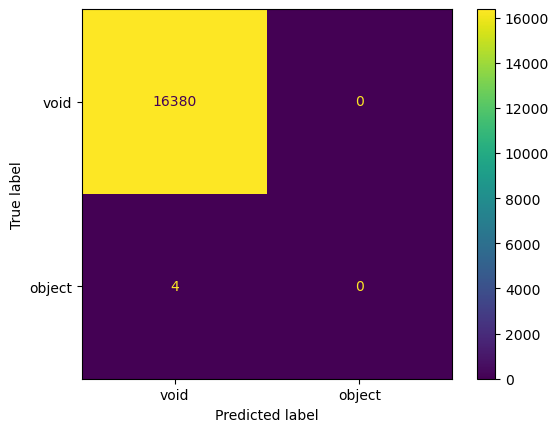

TP: [16380     0]
TN: [    0 16380]
FP: [4 0]
FN: [0 4]
+ predictive value (Precision):  [0.99975586        nan]
- predictive value:  [       nan 0.99975586]
Recall:  [1. 0.]
F1-Score:  [0.99987791        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00024414        nan]
Overall Accuracy:  [0.99975586 0.99975586]


In [50]:
# object
conf_matrix = confusion_matrix(gtmaskID8.flatten(), p_maskID8.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[8]))
compute_metrics(conf_matrix)

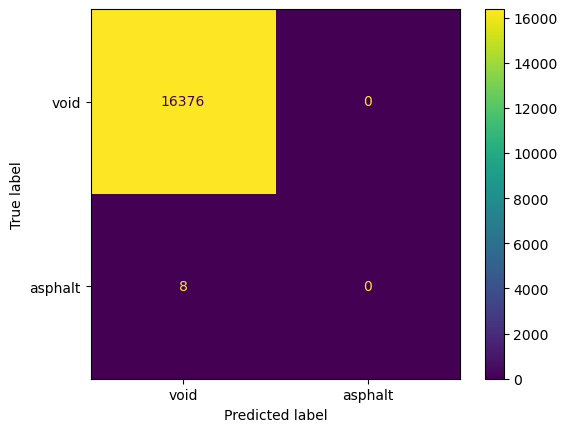

TP: [16376     0]
TN: [    0 16376]
FP: [8 0]
FN: [0 8]
+ predictive value (Precision):  [0.99951172        nan]
- predictive value:  [       nan 0.99951172]
Recall:  [1. 0.]
F1-Score:  [0.9997558       nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00048828        nan]
Overall Accuracy:  [0.99951172 0.99951172]


In [51]:
# asphalt
conf_matrix = confusion_matrix(gtmaskID9.flatten(), p_maskID9.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[9]))
compute_metrics(conf_matrix)

In [ ]:
# da error
# building
#conf_matrix = confusion_matrix(gtmaskID10.flatten(), p_maskID10.flatten())
#plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[10]))
#compute_metrics(conf_matrix)

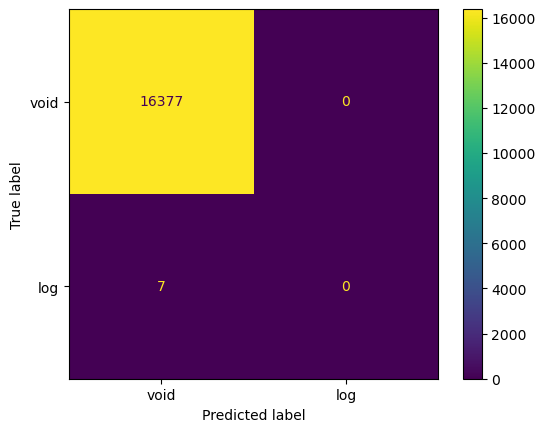

TP: [16377     0]
TN: [    0 16377]
FP: [7 0]
FN: [0 7]
+ predictive value (Precision):  [0.99957275        nan]
- predictive value:  [       nan 0.99957275]
Recall:  [1. 0.]
F1-Score:  [0.99978633        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00042725        nan]
Overall Accuracy:  [0.99957275 0.99957275]


In [53]:
# log
conf_matrix = confusion_matrix(gtmaskID11.flatten(), p_maskID11.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[11]))
compute_metrics(conf_matrix)

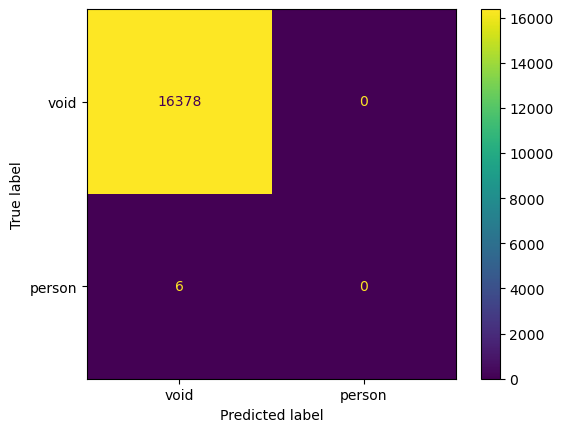

TP: [16378     0]
TN: [    0 16378]
FP: [6 0]
FN: [0 6]
+ predictive value (Precision):  [0.99963379        nan]
- predictive value:  [       nan 0.99963379]
Recall:  [1. 0.]
F1-Score:  [0.99981686        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00036621        nan]
Overall Accuracy:  [0.99963379 0.99963379]


In [54]:
# person
conf_matrix = confusion_matrix(gtmaskID12.flatten(), p_maskID12.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[12]))
compute_metrics(conf_matrix)

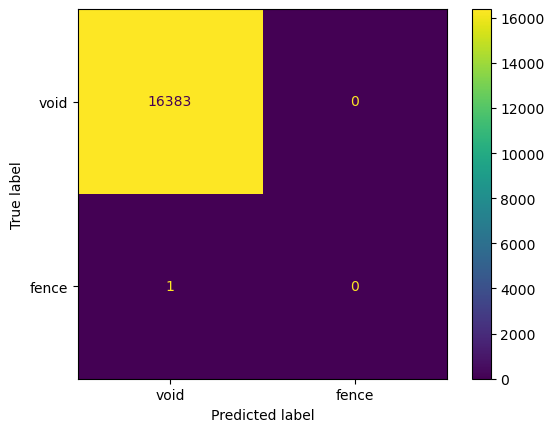

TP: [16383     0]
TN: [    0 16383]
FP: [1 0]
FN: [0 1]
+ predictive value (Precision):  [0.99993896        nan]
- predictive value:  [       nan 0.99993896]
Recall:  [1. 0.]
F1-Score:  [0.99996948        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [6.10351562e-05            nan]
Overall Accuracy:  [0.99993896 0.99993896]


In [55]:
# fence
conf_matrix = confusion_matrix(gtmaskID13.flatten(), p_maskID13.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[13]))
compute_metrics(conf_matrix)

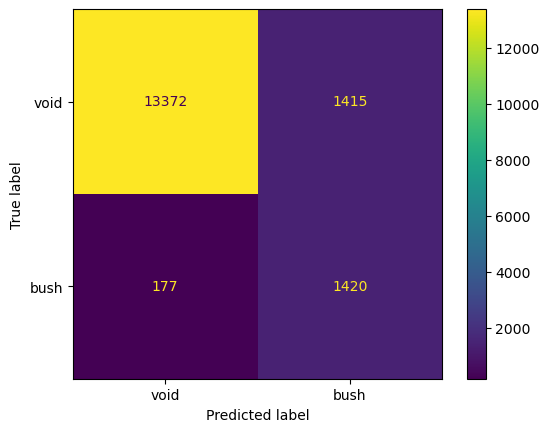

TP: [13372  1420]
TN: [ 1420 13372]
FP: [ 177 1415]
FN: [1415  177]
+ predictive value (Precision):  [0.98693631 0.50088183]
- predictive value:  [0.50088183 0.98693631]
Recall:  [0.90430784 0.88916719]
F1-Score:  [0.94381705 0.64079422]
True + rate:  [0.88916719 0.90430784]
False + rate:  [0.11083281 0.09569216]
False - rate [0.09569216 0.11083281]
False discovery rate:  [0.01306369 0.49911817]
Overall Accuracy:  [0.90283203 0.90283203]


In [56]:
# bush
conf_matrix = confusion_matrix(gtmaskID14.flatten(), p_maskID14.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[14]))
compute_metrics(conf_matrix)

In [ ]:
# Da error
# concrete
#conf_matrix = confusion_matrix(gtmaskID15.flatten(), p_maskID15.flatten())
#plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[15]))
#compute_metrics(conf_matrix)

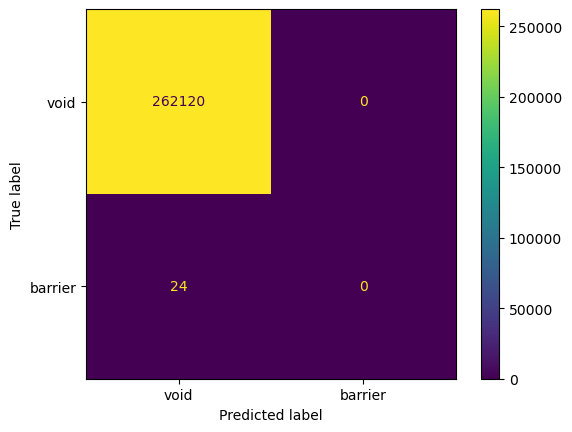

TP: [262120      0]
TN: [     0 262120]
FP: [24  0]
FN: [ 0 24]
+ predictive value (Precision):  [0.99990845        nan]
- predictive value:  [       nan 0.99990845]
Recall:  [1. 0.]
F1-Score:  [0.99995422        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [9.15527344e-05            nan]
Overall Accuracy:  [0.99990845 0.99990845]


In [166]:
# barrier
conf_matrix = confusion_matrix(gtmaskID16.flatten(), p_maskID16.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[16]))
compute_metrics(conf_matrix)

In [ ]:
# da error
# puddle
#conf_matrix = confusion_matrix(gtmaskID17.flatten(), p_maskID17.flatten())
#plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[17]))
#compute_metrics(conf_matrix)

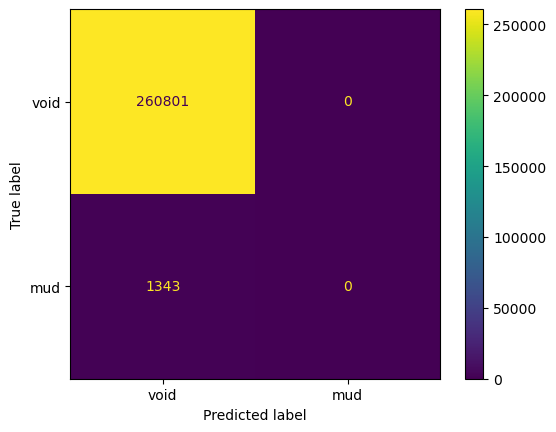

TP: [260801      0]
TN: [     0 260801]
FP: [1343    0]
FN: [   0 1343]
+ predictive value (Precision):  [0.99487686        nan]
- predictive value:  [       nan 0.99487686]
Recall:  [1. 0.]
F1-Score:  [0.99743185        nan]
True + rate:  [0. 1.]
False + rate:  [1. 0.]
False - rate [0. 1.]
False discovery rate:  [0.00512314        nan]
Overall Accuracy:  [0.99487686 0.99487686]


In [168]:
# mud
conf_matrix = confusion_matrix(gtmaskID18.flatten(), p_maskID18.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[18]))
compute_metrics(conf_matrix)

In [59]:
# da error rubble
conf_matrix = confusion_matrix(gtmaskID19.flatten(), p_maskID19.flatten())
#plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[19]))
compute_metrics(conf_matrix)

TP: [16384]
TN: [0]
FP: [0]
FN: [0]
+ predictive value (Precision):  [1.]
- predictive value:  [nan]
Recall:  [1.]
F1-Score:  [1.]
True + rate:  [nan]
False + rate:  [nan]
False - rate [0.]
False discovery rate:  [0.]
Overall Accuracy:  [1.]


## Otra forma de calcular TP, FP, y FN sin la confusion matrix

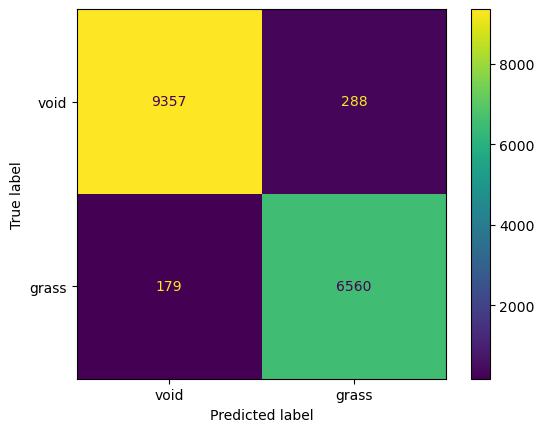

TP: [9357 6560]
TN: [6560 9357]
FP: [179 288]
FN: [288 179]
+ predictive value (Precision):  [0.98122903 0.95794393]
- predictive value:  [0.95794393 0.98122903]
Recall:  [0.97013997 0.9734382 ]
F1-Score:  [0.97565299 0.96562891]
True + rate:  [0.9734382  0.97013997]
False + rate:  [0.0265618  0.02986003]
False - rate [0.02986003 0.0265618 ]
False discovery rate:  [0.01877097 0.04205607]
Overall Accuracy:  [0.97149658 0.97149658]
New TP:  6560
New FP:  288
New FN:  179


In [60]:
# Para la clase id=2 grass, teníamos
# grass
conf_matrix = confusion_matrix(gtmaskID2.flatten(), p_maskID2.flatten())
plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[2]))
compute_metrics(conf_matrix)

# Calculando de nuevo
c=1
TP = np.sum((gtmaskID2 == c) & (p_maskID2 == c))
FP = np.sum((gtmaskID2 != c) & (p_maskID2 == c))
FN = np.sum((gtmaskID2 == c) & (p_maskID2 != c))
print('New TP: ', TP)
print('New FP: ', FP)
print('New FN: ', FN)

## Ahora usamos las máscaras sin filtrar por label

In [61]:
# Leear primera máscara GT y pre del conjunto de test y reshape
maskID = read_image(test_masks[0], mask=True)   
maskID0 = np.reshape(maskID,(IMAGE_SIZE,IMAGE_SIZE))
pred_maskID0 = np.reshape(pred_masksID[0],(IMAGE_SIZE,IMAGE_SIZE))

conf_matrix = confusion_matrix(gtmaskID2.flatten(), p_maskID2.flatten())
#plot_confusion_matrix(conf_matrix,(CLASSES[0],CLASSES[2]))
compute_metrics(conf_matrix)

# Calculando de nuevo
#Groups = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19)
for c in Groups:
    TP = np.sum((maskID0 == c) & (pred_maskID0 == c))
    FP = np.sum((maskID0 != c) & (pred_maskID0 == c))
    FN = np.sum((maskID0 == c) & (pred_maskID0 != c))
    PPV = TP / (TP + FP)  # Precision
    TPR = TP / (TP + FN)  # Recall
    F1 = (2*(PPV * TPR)) /  (PPV + TPR)
    print('Clase: ', CLASSES[c])
    print('New TP: ', TP)
    print('New FP: ', FP)
    print('New FN: ', FN)
    print('New Precision: ', PPV)
    print('New Recall: ', TPR)
    print('New F1-Score: ', F1)

TP: [9357 6560]
TN: [6560 9357]
FP: [179 288]
FN: [288 179]
+ predictive value (Precision):  [0.98122903 0.95794393]
- predictive value:  [0.95794393 0.98122903]
Recall:  [0.97013997 0.9734382 ]
F1-Score:  [0.97565299 0.96562891]
True + rate:  [0.9734382  0.97013997]
False + rate:  [0.0265618  0.02986003]
False - rate [0.02986003 0.0265618 ]
False discovery rate:  [0.01877097 0.04205607]
Overall Accuracy:  [0.97149658 0.97149658]
Clase:  void
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  dirt
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  grass
New TP:  6560
New FP:  288
New FN:  179
New Precision:  0.9579439252336449
New Recall:  0.973438195577979
New F1-Score:  0.9656289099874881
Clase:  tree
New TP:  370
New FP:  18
New FN:  1355
New Precision:  0.9536082474226805
New Recall:  0.2144927536231884
New F1-Score:  0.3502129673450071
Clase:  pole
New TP:  0
New FP:  0
New FN:  12
New Prec

Ahora calculamos las métricas anteriores para cada clase de la misma imagen y las guardamos en un dataframe

In [62]:
import pandas as pd

def check_isnan(metrics):
    nonan_metrics=[]
    newmetric=np.array(0)
    for metric in metrics:
        if np.isnan(metric) == True:  metric=0
        #metric=float(metric)
        metric2=np.around(metric, decimals=3)
        nonan_metrics.append(metric2)

    return nonan_metrics
    
def compute_simple_metrics(GTmaskID, PredmaskID):
    # Calculando de nuevo
    metrics_name=['TP','FP','FN','PPV','TPR','F1']
    Groups = (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19)
    is_present=[]
    df = pd.DataFrame()

    for c in Groups:
        nonan_metrics=[]
        if c==0:
            header = pd.MultiIndex.from_product([[CLASSES[c]], 
                                                 ['TP','FP','FN','PPV','TPR','F1']], 
                                                names=['class','metric'])
        else:
            header = pd.MultiIndex.from_product([[CLASSES[c]], 
                                                 ['TP','FP','FN','PPV','TPR','F1']])
 
        TP = np.sum((GTmaskID == c) & (PredmaskID == c))
        FP = np.sum((GTmaskID != c) & (PredmaskID == c))
        FN = np.sum((GTmaskID == c) & (PredmaskID != c))
        PPV = TP / (TP + FP)  # Precision
        TPR = TP / (TP + FN)  # Recall
        F1 = (2*(PPV * TPR)) /  (PPV + TPR)
        if PPV > 0.6 or TPR > 0.6 or F1 > 0.6: is_present.append(CLASSES[c])
        nonan_metricsbyclass = check_isnan([TP,FP,FN,PPV,TPR,F1])
        nonan_metrics.append(nonan_metricsbyclass)
        if c==0:
            header = pd.MultiIndex.from_product([[CLASSES[c]], metrics_name],names=['class','metric'])
            df1 = pd.DataFrame(np.array(nonan_metrics), index=['a'], columns=header)
            df=df1
        else:
            header = pd.MultiIndex.from_product([[CLASSES[c]], metrics_name])
            df2 = pd.DataFrame(np.array(nonan_metrics), index=['a'], columns=header)
            df = pd.concat([df, df2],axis=1)
    return df, is_present

In [63]:
# first image
maskID = read_image(test_masks[0], mask=True)   
maskID0 = np.reshape(maskID,(IMAGE_SIZE,IMAGE_SIZE))
pred_maskID0 = np.reshape(pred_masksID[0],(IMAGE_SIZE,IMAGE_SIZE))
df, present = compute_simple_metrics(maskID0,pred_maskID0)
display(df)
print('Classes present in the image: ', test_masks[0],present)

void                  dirt            ...   mud                rubble        \
    TP FP FN PPV TPR F1   TP FP FN PPV  ...    FN  PPV  TPR   F1     TP FP FN   
a    0  0  0   0   0  0    0  0  0   0  ...  91.0  0.0  0.0  0.0      0  0  0   

              
  PPV TPR F1  
a   0   0  0  

[1 rows x 120 columns]

Classes present in the image:  ./rellis20/test\labels\frame000000-1581623790_349_20.png ['grass', 'tree', 'sky', 'bush']


____________________

- ¿Qué clases tiene el GT de la mascaraID de la primera imagen de test?
- ¿Cuándo consideramos que una clase existe, si la propia máscara puede tener error?
- cierto numero de pixels?
- 1000?
- ¿Qué métricas y qué threshold consideramos para decir que una clase está presente?
    - Precision and Recall and F1-Score > threshold ¿?
    - Precision or Recall or F1-Score > threshold ¿?
    - Otro?¿

In [64]:
for c in Groups:
    TP = np.sum((maskID0 == c) & (maskID0 == c))
    FP = np.sum((maskID0 != c) & (maskID0 == c))
    FN = np.sum((maskID0 == c) & (maskID0 != c))
    PPV = TP / (TP + FP)  # Precision
    TPR = TP / (TP + FN)  # Recall
    F1 = (2*(PPV * TPR)) /  (PPV + TPR)

    print('Clase: ', CLASSES[c])
    print('New TP: ', TP)
    print('New FP: ', FP)
    print('New FN: ', FN)
    print('New Precision: ', PPV)
    print('New Recall: ', TPR)
    print('New F1-Score: ', F1)

Clase:  void
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  dirt
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  grass
New TP:  6739
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  tree
New TP:  1725
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  pole
New TP:  12
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  water
New TP:  9
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  sky
New TP:  6181
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  vehicle
New TP:  4
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  object
New TP:  4
New FP:  0
New FN:  0
New Precision:  1.0
New Recall:  1.0
New F1-Score:  1.0
Clase:  asphalt
New TP:  8
New FP:  0
New FN:  0
New Precision:  1

---------------------

### Segunda imagen de test

In [65]:
# second image
maskID = read_image(test_masks[1], mask=True)   
maskID1 = np.reshape(maskID,(IMAGE_SIZE,IMAGE_SIZE))
pred_maskID1 = np.reshape(pred_masksID[1],(IMAGE_SIZE,IMAGE_SIZE))
df, present = compute_simple_metrics(maskID1,pred_maskID1)
display(df)
print('Classes present in the image: ', test_masks[1],present)

void                  dirt            ...    mud                       \
    TP FP FN PPV TPR F1   TP FP FN PPV  ...     FN    PPV    TPR     F1   
a    0  0  0   0   0  0    0  0  0   0  ...  104.0  0.101  0.329  0.154   

  rubble                   
      TP FP FN PPV TPR F1  
a      0  0  0   0   0  0  

[1 rows x 120 columns]

Classes present in the image:  ./rellis20/test\labels\frame000000-1581624652_750_20.png ['grass', 'tree', 'sky', 'bush', 'puddle']


In [66]:
for c in Groups:
    TP = np.sum((maskID1 == c) & (pred_maskID1 == c))
    FP = np.sum((maskID1 != c) & (pred_maskID1 == c))
    FN = np.sum((maskID1 == c) & (pred_maskID1 != c))
    PPV = TP / (TP + FP)  # Precision
    TPR = TP / (TP + FN)  # Recall
    F1 = (2*(PPV * TPR)) /  (PPV + TPR)

    print('Clase: ', CLASSES[c])
    print('New TP: ', TP)
    print('New FP: ', FP)
    print('New FN: ', FN)
    print('New Precision: ', PPV)
    print('New Recall: ', TPR)
    print('New F1-Score: ', F1)

Clase:  void
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  dirt
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  grass
New TP:  2269
New FP:  505
New FN:  702
New Precision:  0.8179524152847873
New Recall:  0.7637159205654662
New F1-Score:  0.7899042645778939
Clase:  tree
New TP:  3020
New FP:  2164
New FN:  332
New Precision:  0.5825617283950617
New Recall:  0.9009546539379475
New F1-Score:  0.7075913776944706
Clase:  pole
New TP:  0
New FP:  0
New FN:  12
New Precision:  nan
New Recall:  0.0
New F1-Score:  nan
Clase:  water
New TP:  0
New FP:  7
New FN:  15
New Precision:  0.0
New Recall:  0.0
New F1-Score:  nan
Clase:  sky
New TP:  3558
New FP:  618
New FN:  18
New Precision:  0.8520114942528736
New Recall:  0.9949664429530202
New F1-Score:  0.9179566563467493
Clase:  vehicle
New TP:  0
New FP:  0
New FN:  8
New Precision:  nan
New Recall:  0.0
New F1-Score:  nan
Clase:  object
New TP:

------------

### Tercera imagen de test

In [67]:
# tercera image
maskID = read_image(test_masks[2], mask=True)   
maskID2 = np.reshape(maskID,(IMAGE_SIZE,IMAGE_SIZE))
pred_maskID2 = np.reshape(pred_masksID[2],(IMAGE_SIZE,IMAGE_SIZE))
df, present = compute_simple_metrics(maskID2,pred_maskID2)
display(df)
print('Classes present in the image: ', test_masks[2],present)

void                  dirt            ...   mud                rubble        \
    TP FP FN PPV TPR F1   TP FP FN PPV  ...    FN  PPV  TPR   F1     TP FP FN   
a    0  0  0   0   0  0    0  0  0   0  ...  59.0  0.0  0.0  0.0      0  0  0   

              
  PPV TPR F1  
a   0   0  0  

[1 rows x 120 columns]

Classes present in the image:  ./rellis20/test\labels\frame000002-1581623790_549_20.png ['grass', 'tree', 'sky', 'bush']


In [68]:
for c in Groups:
    TP = np.sum((maskID2 == c) & (pred_maskID2 == c))
    FP = np.sum((maskID2 != c) & (pred_maskID2 == c))
    FN = np.sum((maskID2 == c) & (pred_maskID2 != c))
    PPV = TP / (TP + FP)  # Precision
    TPR = TP / (TP + FN)  # Recall
    F1 = (2*(PPV * TPR)) /  (PPV + TPR)

    print('Clase: ', CLASSES[c])
    print('New TP: ', TP)
    print('New FP: ', FP)
    print('New FN: ', FN)
    print('New Precision: ', PPV)
    print('New Recall: ', TPR)
    print('New F1-Score: ', F1)

Clase:  void
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  dirt
New TP:  0
New FP:  0
New FN:  0
New Precision:  nan
New Recall:  nan
New F1-Score:  nan
Clase:  grass
New TP:  6590
New FP:  231
New FN:  212
New Precision:  0.966133997947515
New Recall:  0.9688326962658041
New F1-Score:  0.9674814651691992
Clase:  tree
New TP:  363
New FP:  8
New FN:  1334
New Precision:  0.9784366576819407
New Recall:  0.2139068945197407
New F1-Score:  0.351063829787234
Clase:  pole
New TP:  0
New FP:  0
New FN:  15
New Precision:  nan
New Recall:  0.0
New F1-Score:  nan
Clase:  water
New TP:  0
New FP:  0
New FN:  10
New Precision:  nan
New Recall:  0.0
New F1-Score:  nan
Clase:  sky
New TP:  6171
New FP:  153
New FN:  26
New Precision:  0.9758064516129032
New Recall:  0.9958044214942714
New F1-Score:  0.9857040172510183
Clase:  vehicle
New TP:  0
New FP:  0
New FN:  3
New Precision:  nan
New Recall:  0.0
New F1-Score:  nan
Clase:  object
New TP:  0
N

## IoU and Dice score metrics
The function below generates the IOU and dice score of the prediction and ground truth masks. From the lectures, it is given that:

 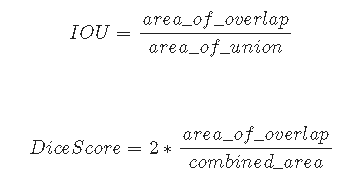

The code below does that for you. A small smoothening factor is introduced in the denominators to prevent possible division by zero.

In [143]:
def compute_metrics(y_true, y_pred):
  '''
  Computes IOU and Dice Score.

  Args:
    y_true (tensor) - ground truth label map
    y_pred (tensor) - predicted label map
  '''
  
  class_wise_iou = []
  class_wise_dice_score = []

  smoothening_factor = 0.00001

  for i in range(len(CLASSES)):
    intersection = np.sum((y_pred == i) * (y_true == i))
    y_true_area = np.sum((y_true == i))
    y_pred_area = np.sum((y_pred == i))
    combined_area = y_true_area + y_pred_area
    
    iou = (intersection + smoothening_factor) / (combined_area - intersection + smoothening_factor)
    class_wise_iou.append(iou)
    
    dice_score =  2 * ((intersection + smoothening_factor) / (combined_area + smoothening_factor))
    class_wise_dice_score.append(dice_score)

  return class_wise_iou, class_wise_dice_score

# Predicción de MaskID - Mostrar RGB vs GT MaskID original vs Predicción maskID
def plot_Pred_Metrics(images_list, mask_id, model):
    aux=0
    for image_file in images_list:
        image_tensor = read_image(image_file)                            # Read RGB test image
        mask_id_gt = read_image(mask_id[aux], mask=True)                 # Ground Truth MaskID
        pred_mask_id = infer(image_tensor=image_tensor, model=model)     # Predicted MaskID
        
        plot_pred_matplotlib(
            [image_tensor, mask_id_gt, pred_mask_id], figsize=(18, 14)
        )
        aux+=1
        

def plot_pred_matplotlib(display_list, figsize=(5, 3)):
    titles=["RGB Image", "Predicted Mask", "True Mask"]
    _, axes = plt.subplots(nrows=1, ncols=len(display_list), figsize=figsize)

    for idx, im in enumerate(display_list):
        plt.subplot(1, 3, idx+1)
        if display_list[idx].shape[-1] == 3:
            plt.title(titles[idx], fontsize=12)
            plt.imshow(keras.utils.array_to_img(display_list[idx]))   
        else:
            plt.title(titles[idx], fontsize=12)
            plt.imshow(im)
            if idx ==1:
                show_iou_dice (iou, dice_score)
       # if idx == 1:
       #   plt.xlabel(display_string)
        plt.xticks([])
        plt.yticks([])

def show_iou_dice (iou_list, dice_score_list):
    metrics_by_id = [(idx, iou, dice_score) for idx, (iou, dice_score) in enumerate(zip(iou_list, dice_score_list)) if iou > 0.0]
    metrics_by_id.sort(key=lambda tup: tup[1], reverse=True)  # sorts in place
  
    display_string_list = ["{}: IOU: {} Dice Score: {}".format(CLASSES[idx], iou, dice_score) for idx, iou, dice_score in metrics_by_id]
    display_string = "\n\n".join(display_string_list) 
    plt.xlabel(display_string)
    


### Show Predictions and Metrics
You can now see the predicted segmentation masks side by side with the ground truth. The metrics are also overlayed so you can evaluate how your model is doing.

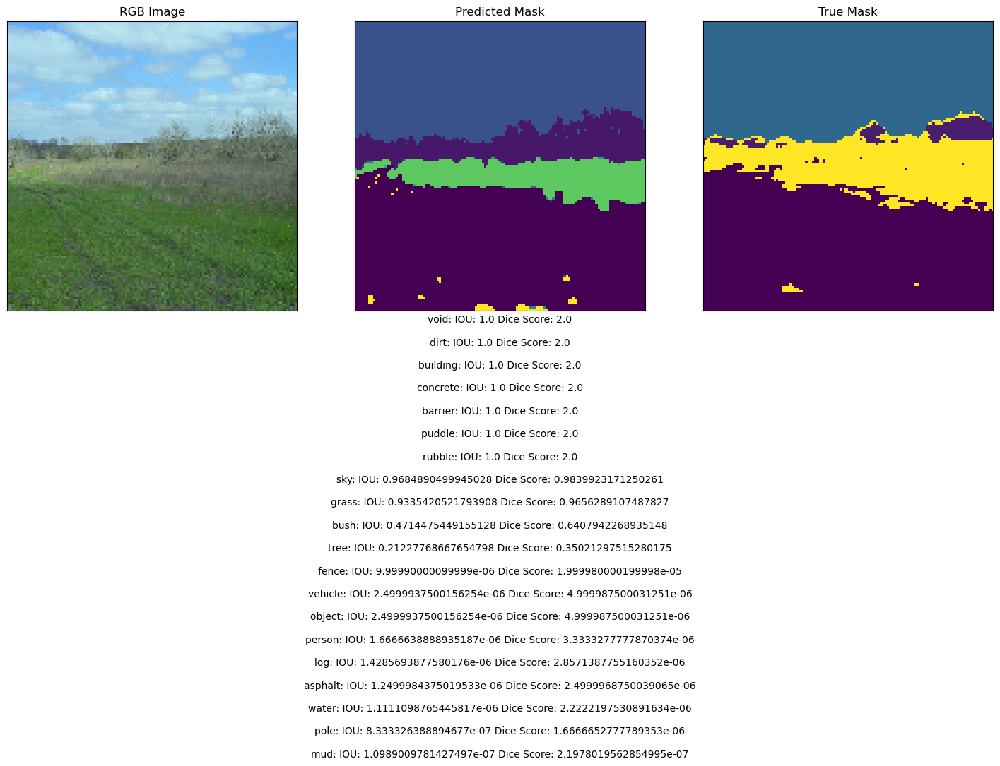

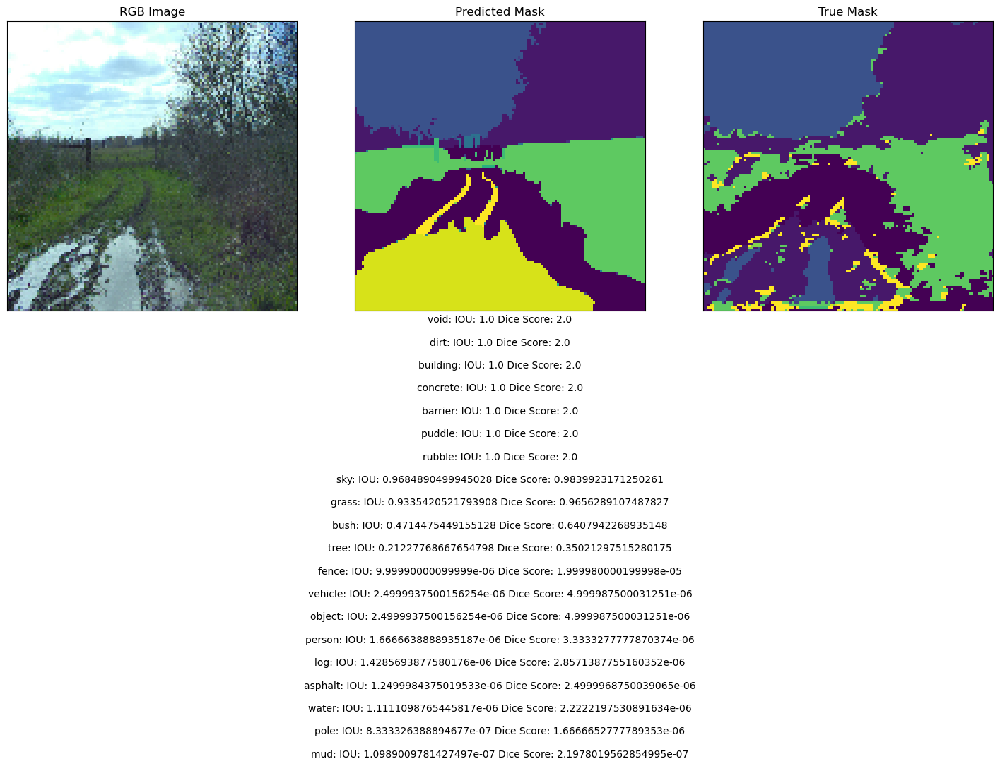

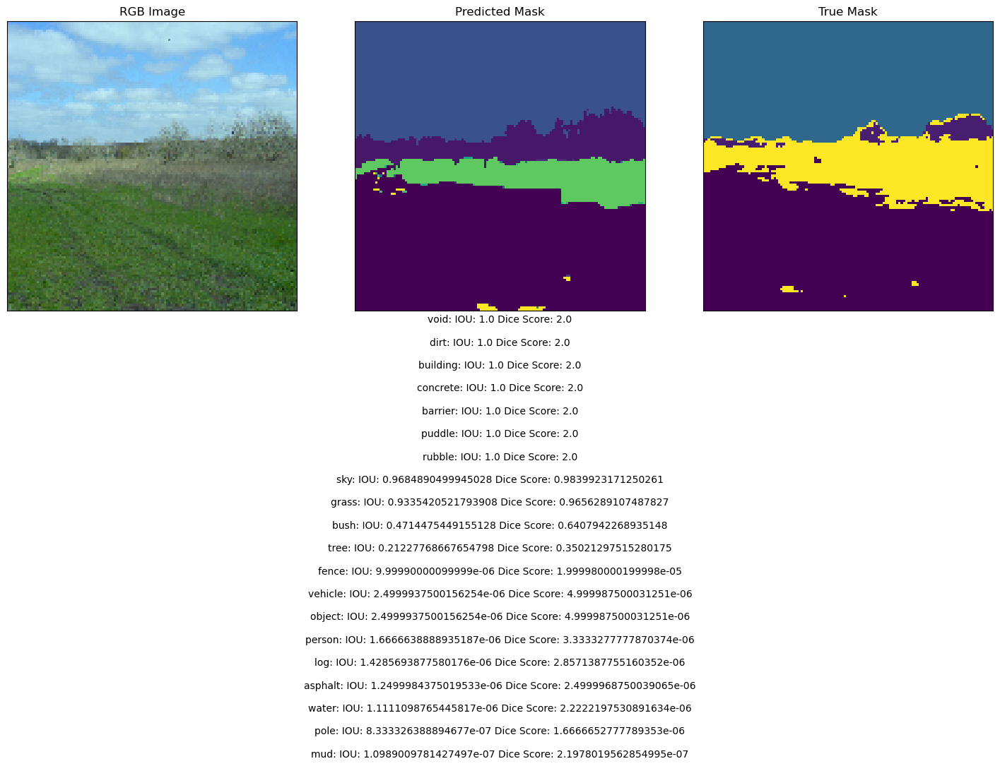

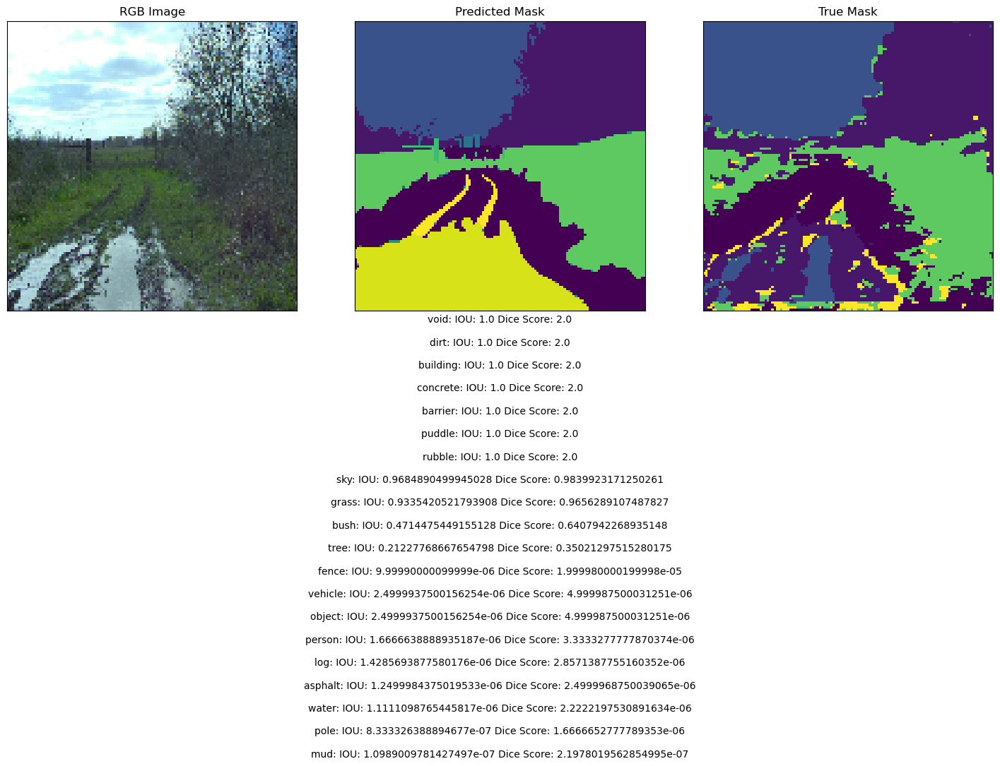

In [144]:
# first image
maskID = read_image(test_masks[0], mask=True)   
maskID0 = np.reshape(maskID,(IMAGE_SIZE,IMAGE_SIZE))
pred_maskID0 = np.reshape(pred_masksID[0],(IMAGE_SIZE,IMAGE_SIZE))
#df, present = compute_simple_metrics(maskID0,pred_maskID0)
#display(df)
#print('Classes present in the image: ', test_masks[0],present)

# compute metrics
iou, dice_score = compute_metrics(maskID0, pred_maskID0) 

# visualize the output and metrics
plot_Pred_Metrics(test_images[:4], test_masks[:4], model=model)
